# **Breast cancer histopathology image classification using hybrid optimized deep learning model**

In [ ]:
import cv2
import matplotlib.pyplot as plt
import glob
from pathlib import Path
from sklearn import *
import numpy as np
import pandas as pd
import seaborn as sns
import math
import shutil
import matplotlib.pyplot as plt
from sklearn.utils import resample
import numpy as np 
import pandas as pd 
import os 
from os import listdir
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.utils import to_categorical
from keras.preprocessing import image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from tqdm import tqdm
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPool2D, Flatten
from keras.utils import np_utils
from sklearn.metrics import accuracy_score
%matplotlib inline
from PIL import Image
from tensorflow.keras.callbacks import EarlyStopping, Callback , ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import precision_recall_curve, roc_curve, accuracy_score, confusion_matrix, precision_score, recall_score, classification_report
import keras.utils as image
from PIL import Image, ImageFilter 
from tensorflow.keras.applications import VGG19,VGG16
from tensorflow.keras.applications.inception_v3 import InceptionV3
import tensorflow as tf
from tensorflow.keras.optimizers import RMSprop

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = glob.glob('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/**/*.png', recursive=True)
print('No. of Images in the directory ', len(data))

No. of Images in the directory  7919


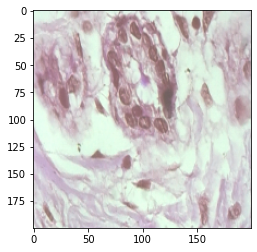

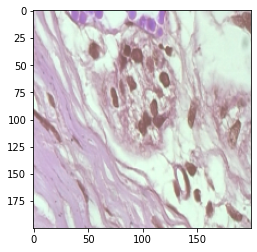

In [ ]:
for i in data[:2]:
    img=cv2.imread(i)
    img_1=cv2.resize(img,(200,200))
    plt.imshow(img_1,cmap='binary')
    plt.show()

In [ ]:
data_benign = glob.glob('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/**/*.png', recursive=True)
data_malignant = glob.glob('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/malignant/**/*.png', recursive=True)
print('No. of files in the directory Benign', len(data_benign))
print('No. of files in the directory Malignant', len(data_malignant))

No. of files in the directory Malignant 2480
No. of files in the directory Benign 5439


In [ ]:
dataset_path = Path('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast')
images_link = list(dataset_path.glob(r'**/*.png'))
images_mag = [x.parents[0].stem for x in images_link]
images_subTypes = [x.parents[2].stem for x in images_link]
images_name = [x.parents[4].stem for x in images_link]
images_labels=preprocessing.LabelEncoder().fit_transform(images_name)

df=pd.DataFrame()
df['Link']=images_link
df['Mag']=images_mag
df['SubTypes']=images_subTypes
df['Label']=images_name
df['Label_int']=images_labels

In [ ]:
df

,Link,Mag,SubTypes,Label,Label_int
0,/content/drive/MyDrive/BreaKHis_v1/histology_s...,400X,fibroadenoma,benign,0
1,/content/drive/MyDrive/BreaKHis_v1/histology_s...,400X,fibroadenoma,benign,0
2,/content/drive/MyDrive/BreaKHis_v1/histology_s...,400X,fibroadenoma,benign,0
3,/content/drive/MyDrive/BreaKHis_v1/histology_s...,400X,fibroadenoma,benign,0
4,/content/drive/MyDrive/BreaKHis_v1/histology_s...,400X,fibroadenoma,benign,0
...,...,...,...,...,...
7914,/content/drive/MyDrive/BreaKHis_v1/histology_s...,200X,ductal_carcinoma,malignant,1
7915,/content/drive/MyDrive/BreaKHis_v1/histology_s...,200X,ductal_carcinoma,malignant,1
7916,/content/drive/MyDrive/BreaKHis_v1/histology_s...,200X,ductal_carcinoma,malignant,1
7917,/content/drive/MyDrive/BreaKHis_v1/histology_s...,200X,ductal_carcinoma,malignant,1


In [ ]:
print('No. of labels:',df['Label_int'].nunique())
print('No. of files in the directory Malignant', len(df[df['Label'] == 'malignant']))
print('No. of files in the directory Benign', len(df[df['Label'] == 'benign']))

No. of labels: 2
No. of files in the directory Malignant 5439
No. of files in the directory Benign 2480


In [ ]:
df.groupby(['SubTypes'])["SubTypes"].count()

SubTypes
adenosis                444
ductal_carcinoma       3461
fibroadenoma           1014
lobular_carcinoma       626
mucinous_carcinoma      792
papillary_carcinoma     560
phyllodes_tumor         453
tubular_adenoma         569
Name: SubTypes, dtype: int64

In [ ]:
df_benign = df[df['Label'] == 'benign']
df_benign_link = df_benign['Link']

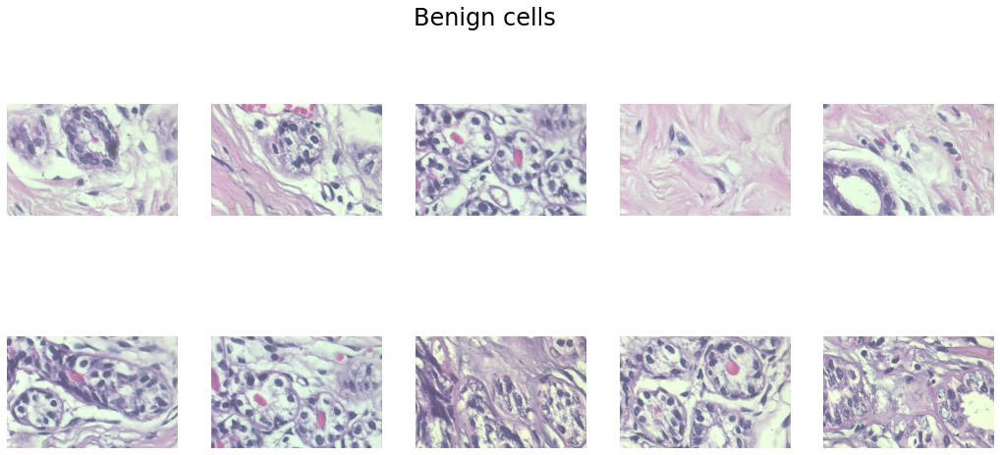

In [ ]:
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Benign cells', fontsize=24)

for ind, img_src in enumerate(df_benign_link[:10]):
    plt.subplot(2, 5, ind+1)
    img = plt.imread(img_src)
    plt.axis('off')
    plt.imshow(img)

In [ ]:
df_malignant = df[df['Label'] == 'malignant']
df_malignant_link = df_malignant['Link']

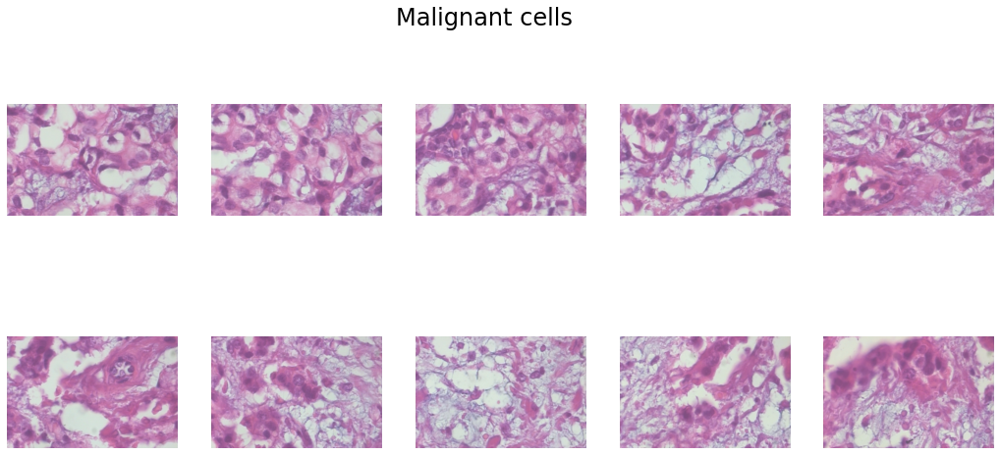

In [ ]:
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Malignant cells', fontsize=24)

for ind, img_src in enumerate(df_malignant_link[:10]):
    plt.subplot(2, 5, ind+1)
    img = plt.imread(img_src)
    plt.axis('off')
    plt.imshow(img)

# Preprocessing

## Median Filter

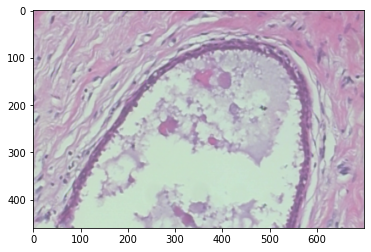

In [ ]:
image = Image.open(r"/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png") 

image_Median = image.filter(ImageFilter.MedianFilter(size = 3)) 
      
plt.imshow(image_Median)

In [ ]:
image_Median.save("/content/drive/MyDrive/Breast Cancer Histopathological Project/FilterImages/Median/withMedianfilter.png")

In [ ]:
original = cv2.imread("/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png")
MedianFilter = cv2.imread("/content/drive/MyDrive/Breast Cancer Histopathological Project/FilterImages/Median/withMedianfilter.png", 1)

def mse(imageA, imageB):
	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])

	return err

def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))
    
MSE_score = mse(original, MedianFilter)
RMSE_score = math.sqrt(MSE_score)
PSNR_score = psnr(original, MedianFilter)
print("MSE Score: " ,MSE_score)
print("RMSE Score: " ,RMSE_score)
print("PSNR Score: " ,PSNR_score)

MSE Score:  16.908782608695653
RMSE Score:  4.112029013600908
PSNR Score:  40.78062005833275


## Gaussian Blur Filter

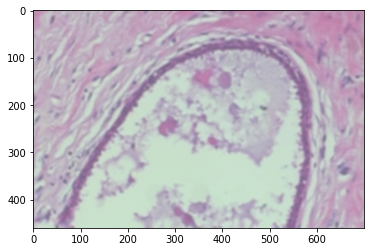

In [ ]:
from PIL import Image, ImageFilter
  
image = Image.open(r"/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png")

image_Gaussian = image.filter(ImageFilter.GaussianBlur)
  
plt.imshow(image_Gaussian)

In [ ]:
image_Gaussian.save("/content/drive/MyDrive/Breast Cancer Histopathological Project/FilterImages/Gaussian/withGaussianfilter.png")

In [ ]:
original = cv2.imread("/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png")
GaussianFilter = cv2.imread("/content/drive/MyDrive/Breast Cancer Histopathological Project/FilterImages/Gaussian/withGaussianfilter.png", 1)

def mse(imageA, imageB):
	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])

	return err

def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))
MSE_score1 = mse(original, GaussianFilter)
RMSE_score1 = math.sqrt(MSE_score1)
PSNR_score1 = psnr(original, GaussianFilter)
print("MSE Score: " ,MSE_score1)
print("RMSE Score: " ,RMSE_score1)
print("PSNR Score: " ,PSNR_score1)

MSE Score:  138.5751149068323
RMSE Score:  11.771793189944866
PSNR Score:  33.24605743944431


## Sharpen Filter

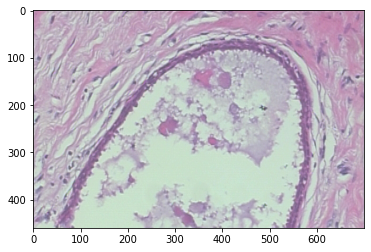

In [ ]:
image = Image.open("/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png");

image_Sharpen = image.filter(ImageFilter.SHARPEN);

plt.imshow(image_Sharpen)

In [ ]:
image_Sharpen.save("/content/drive/MyDrive/Breast Cancer Histopathological Project/FilterImages/Sharpen/withSharpenfilter.png")

In [ ]:
original = cv2.imread("/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png")
SharpenFilter = cv2.imread("/content/drive/MyDrive/Breast Cancer Histopathological Project/FilterImages/Sharpen/withSharpenfilter.png", 1)

def mse(imageA, imageB):
	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])

	return err

def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))
MSE_score2 = mse(original, SharpenFilter)
RMSE_score2 = math.sqrt(MSE_score2)
PSNR_score2 = psnr(original, SharpenFilter)
print("MSE Score: " ,MSE_score2)
print("RMSE Score: " ,RMSE_score2)
print("PSNR Score: " ,PSNR_score2)

MSE Score:  33.303360248447206
RMSE Score:  5.77090636282094
PSNR Score:  37.937773089311165


## Bilateral Filter

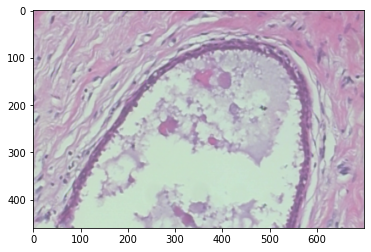

In [ ]:
image = cv2.imread("/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png")
# Apply bilateral filter with d = 15,
# sigmaColor = sigmaSpace = 75.
bilateral = cv2.bilateralFilter(image, 15, 75, 75)
 
plt.imshow(image_Median)

In [ ]:
cv2.imwrite('/content/drive/MyDrive/Breast Cancer Histopathological Project/FilterImages/Bilateral/withBilateralFilter.png', bilateral)

True

In [ ]:
original = cv2.imread("/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/SOB/adenosis/SOB_B_A_14-22549AB/100X/SOB_B_A-14-22549AB-100-001.png")
BilateralFilter = cv2.imread("/content/drive/MyDrive/Breast Cancer Histopathological Project/FilterImages/Bilateral/withBilateralFilter.png", 1)

def mse(imageA, imageB):
	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])

	return err



def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))
MSE_score3 = mse(original, BilateralFilter)
RMSE_score3 = math.sqrt(MSE_score2)
PSNR_score3 = psnr(original, BilateralFilter)
print("MSE Score: " ,MSE_score3)
print("RMSE Score: " ,RMSE_score3)
print("PSNR Score: " ,PSNR_score3)

MSE Score:  142.47747826086956
RMSE Score:  5.77090636282094
PSNR Score:  32.47381271199313


# **WITHOUT FILTER**

In [ ]:
benign = glob.glob('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/**/*.png', recursive=True)
malignent = glob.glob('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/malignant/**/*.png', recursive=True)

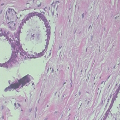

In [ ]:
import keras.utils as image
image.load_img(benign[0], target_size=(120,120,1), grayscale=False)

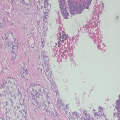

In [ ]:
image.load_img(malignent[0], target_size=(120,120,1), grayscale=False)

In [ ]:
len(benign)+len(malignent)

7909

In [ ]:
Imagedata = pd.DataFrame(index=np.arange(0, len(benign)+len(malignent)), columns=["image", "target"])
k=0
for c in [0,1]:
        if c==1:
            for m in range(len(benign)):
                Imagedata.iloc[k]["image"] = benign[m]
                Imagedata.iloc[k]["target"] = 0
                k += 1
        else:
            for m in range(len(malignent)):
                Imagedata.iloc[k]["image"] = malignent[m]
                Imagedata.iloc[k]["target"] = 1
                k += 1

In [ ]:
downsampled_data = resample(Imagedata[Imagedata['target']==1],n_samples=Imagedata[Imagedata['target']==0].shape[0], random_state=42)

downsampled = pd.concat([Imagedata[Imagedata['target']==0], downsampled_data])

downsampled['target'].value_counts()

0    2480
1    2480
Name: target, dtype: int64

In [ ]:
train_image = []
y = []

for i in tqdm(range(downsampled.shape[0])):
    img = image.load_img(downsampled['image'].iloc[i], target_size=(75,75,1), grayscale=False)
    img = image.img_to_array(img)
    img = img/255
    train_image.append(img)
        
X = np.array(train_image)
y = downsampled.iloc[:,-1].values
y = np.array(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, random_state=42, test_size=0.2 , shuffle=True)

Y_train = np.asarray(y_train).astype(np.float32)
Y_test   = np.asarray(y_test).astype(np.float32)
Y_val   = np.asarray(y_val).astype(np.float32)

print(X_train.shape)
print(X_test.shape)
print(X_val.shape)

100%|██████████| 4960/4960 [06:56<00:00, 11.91it/s]


(3968, 75, 75, 3)
(793, 75, 75, 3)
(199, 75, 75, 3)


## CNN MODEL

In [ ]:
cnn_model = Sequential()

cnn_model.add(Conv2D(filters =32, kernel_size = (3,3), strides=(1,1), padding='valid', activation='relu', input_shape=(75,75,3)))
cnn_model.add(MaxPool2D(pool_size=(1,1)))

cnn_model.add(Conv2D(filters = 64, kernel_size = (3,3), padding = 'valid',activation = 'relu'))
cnn_model.add(MaxPooling2D(pool_size = (2,2)))

cnn_model.add(Conv2D(filters = 128, kernel_size = (3,3), padding = 'valid', activation = 'relu'))
cnn_model.add(MaxPooling2D(pool_size = (2,2)))
cnn_model.add(Dropout(0.4))

cnn_model.add(Conv2D(filters = 256, kernel_size = (3,3), padding = 'valid', activation = 'relu'))
cnn_model.add(MaxPooling2D(pool_size = (2,2)))
cnn_model.add(Dropout(0.2))

cnn_model.add(Flatten())  
cnn_model.add(Dense(256, activation = 'relu'))
cnn_model.add(Dense(150, activation='relu'))  
cnn_model.add(Dense(1, activation='sigmoid'))  
cnn_model.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

### Save the CNN Model and its Weigths

In [ ]:
cnn_model.save('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/CNN_Model')

In [ ]:
cnn_model.save_weights('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model_Weights/CNN_Model/CNN_Model_Weights')

## CNN MODEL WITHOUT FILTER

In [ ]:
cnn_model_WF = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/CNN_Model')

In [ ]:
cnn_model_WF.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
cnn_history_WF = cnn_model_WF.fit(X_train, Y_train, batch_size=10, epochs = 25, validation_data=(X_val, Y_val))

Epoch 1/25
397/397 [==============================] - 180s 448ms/step - loss: 0.4547 - accuracy: 0.7956 - val_loss: 0.4637 - val_accuracy: 0.8090
Epoch 2/25
397/397 [==============================] - 168s 424ms/step - loss: 0.5008 - accuracy: 0.7724 - val_loss: 0.5704 - val_accuracy: 0.7236
Epoch 3/25
397/397 [==============================] - 167s 420ms/step - loss: 0.4939 - accuracy: 0.7598 - val_loss: 0.4673 - val_accuracy: 0.7990
Epoch 4/25
397/397 [==============================] - 169s 425ms/step - loss: 0.4524 - accuracy: 0.7916 - val_loss: 0.4409 - val_accuracy: 0.7839
Epoch 5/25
397/397 [==============================] - 169s 425ms/step - loss: 0.4468 - accuracy: 0.7976 - val_loss: 0.4392 - val_accuracy: 0.8090
Epoch 6/25
397/397 [==============================] - 166s 418ms/step - loss: 0.4315 - accuracy: 0.8085 - val_loss: 0.4375 - val_accuracy: 0.7990
Epoch 7/25
397/397 [==============================] - 164s 412ms/step - loss: 0.4266 - accuracy: 0.8087 - val_loss: 0.4293 -

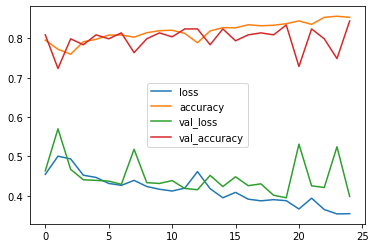

In [ ]:
history_cnn_WF = pd.DataFrame(cnn_history_WF.history)
history_cnn_WF.plot()

In [ ]:
cnn_model_WF.evaluate(X_test, Y_test)

25/25 [==============================] - 8s 315ms/step - loss: 0.4474 - accuracy: 0.8285


[0.447422593832016, 0.8284993767738342]

In [ ]:
pred_cnn_WF = cnn_model_WF.predict(X_train)

124/124 [==============================] - 39s 317ms/step


In [ ]:
precisions_cnn_WF, recalls_cnn_WF, thresholds_cnn_WF = precision_recall_curve(Y_train, pred_cnn_WF)

In [ ]:
predictions_cnn_WF = cnn_model_WF.predict(X_test)

25/25 [==============================] - 8s 318ms/step


In [ ]:
binary_pred_cnn_WF = []
thres_cnn_WF = thresholds_cnn_WF[np.argmax(precisions_cnn_WF >= 0.80)]
for i in predictions_cnn_WF:
    if i >= thres_cnn_WF:
        binary_pred_cnn_WF.append(1)
    else:
        binary_pred_cnn_WF.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_cnn_WF, Y_test))
print('Precision on testing set:', precision_score(binary_pred_cnn_WF, Y_test))
print('Recall on testing set:', recall_score(binary_pred_cnn_WF, Y_test))

Accuracy on testing set: 0.8108448928121059
Precision on testing set: 0.9081885856079405
Recall on testing set: 0.7640918580375783


#### Confusion Matrix in CNN Model

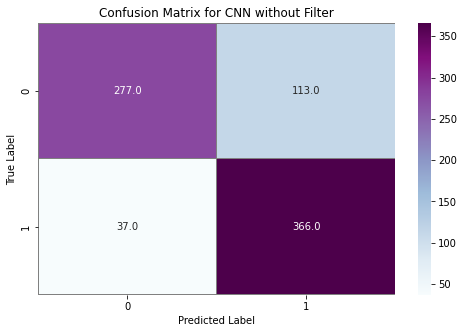

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_cnn_WF = confusion_matrix(Y_test, binary_pred_cnn_WF) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_cnn_WF, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for CNN without Filter")
plt.show()

#### Prediction in CNN model

1/1 [==============================] - 0s 33ms/step


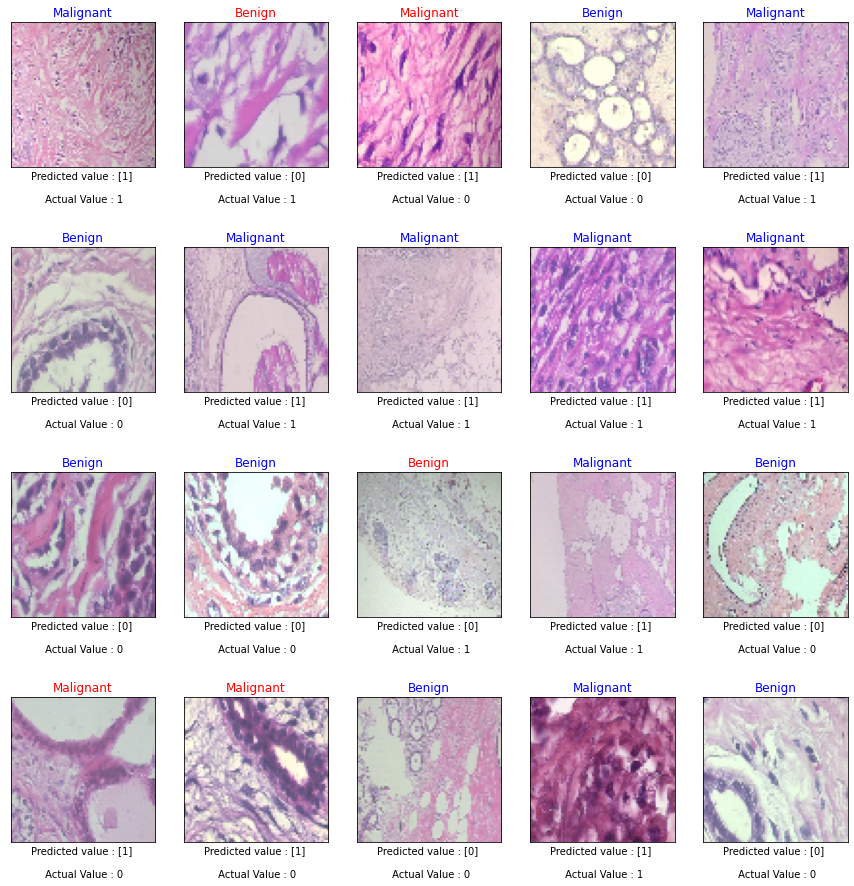

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test[i:i+1]
    pred = cnn_model_WF.predict(input)
    binary_pred = []
    threshold = thresholds_cnn_WF[np.argmax(precisions_cnn_WF >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test[i].astype(np.int64)
    plt.imshow(X_test[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classification report

Text(0.5, 1.0, 'CNN WITHOUT FILTER')

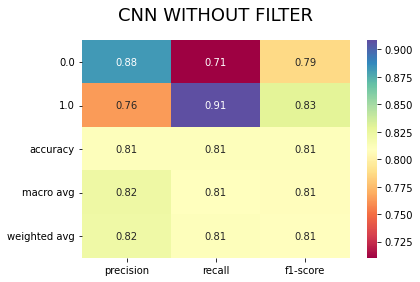

In [ ]:
clf_report_cnn_WF = classification_report(Y_test, binary_pred_cnn_WF,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_cnn_WF).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("CNN WITHOUT FILTER",fontsize=18,pad=20)

## VGG16 MODEL 

In [ ]:
VGG16_model = VGG16(input_shape = (75, 75, 3),include_top = False, weights = 'imagenet')

58889256/58889256 [==============================] - 4s 0us/step


In [ ]:
for layer in VGG16_model.layers:
    layer.trainable = False

In [ ]:
# Flatten the output layer to 1 dimension
modelVGG16 = keras.layers.Flatten()(VGG16_model.output)

# Add a fully connected layer with 512 hidden units and ReLU activation
modelVGG16 = keras.layers.Dense(512, activation='relu')(modelVGG16)

# Add a dropout rate of 0.5
modelVGG16 = keras.layers.Dropout(0.5)(modelVGG16)

# Add a final sigmoid layer with 1 node for classification output
modelVGG16 = keras.layers.Dense(1, activation='sigmoid')(modelVGG16)

model_modelVGG16 = tf.keras.models.Model(VGG16_model.input, modelVGG16)

model_modelVGG16.compile(optimizer = tf.keras.optimizers.RMSprop(lr=0.0001), loss = 'binary_crossentropy',metrics = ['acc'])

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:135: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


### Save the VGG16 Model and its Weights

In [ ]:
# model_modelVGG16.save('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/VGG16_Model')

In [ ]:
# model_modelVGG16.save_weights('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model_Weights/VGG16_Model/VGG16_Weights')

## VGG16 WITHOUT FILTER

In [ ]:
vgg16_model_WF = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/VGG16_Model')

In [ ]:
vgg16_model_WF.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
vgg16_history_WF = vgg16_model_WF.fit(X_train, Y_train, batch_size=10, epochs = 25, validation_data=(X_val, Y_val))

Epoch 1/25
397/397 [==============================] - 264s 661ms/step - loss: 0.6243 - accuracy: 0.6719 - val_loss: 0.5351 - val_accuracy: 0.7688
Epoch 2/25
397/397 [==============================] - 238s 599ms/step - loss: 0.5271 - accuracy: 0.7414 - val_loss: 0.5020 - val_accuracy: 0.8040
Epoch 3/25
397/397 [==============================] - 237s 596ms/step - loss: 0.4875 - accuracy: 0.7707 - val_loss: 0.4908 - val_accuracy: 0.7940
Epoch 4/25
397/397 [==============================] - 234s 589ms/step - loss: 0.4754 - accuracy: 0.7850 - val_loss: 0.4577 - val_accuracy: 0.8342
Epoch 5/25
397/397 [==============================] - 234s 588ms/step - loss: 0.4640 - accuracy: 0.7787 - val_loss: 0.4666 - val_accuracy: 0.7839
Epoch 6/25
397/397 [==============================] - 234s 588ms/step - loss: 0.4366 - accuracy: 0.7989 - val_loss: 0.4825 - val_accuracy: 0.7990
Epoch 7/25
397/397 [==============================] - 232s 584ms/step - loss: 0.4309 - accuracy: 0.8032 - val_loss: 0.4480 -

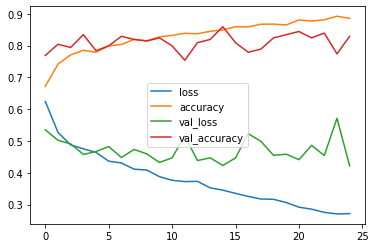

In [ ]:
history_vgg16_WF = pd.DataFrame(vgg16_history_WF.history)
history_vgg16_WF.plot()

In [ ]:
vgg16_model_WF.evaluate(X_test, Y_test)

25/25 [==============================] - 46s 2s/step - loss: 0.4337 - accuracy: 0.8184


[0.433684378862381, 0.818411111831665]

In [ ]:
pred_vgg16_WF = vgg16_model_WF.predict(X_train)

124/124 [==============================] - 220s 2s/step


In [ ]:
precisions_vgg16_WF, recalls_vgg16_WF, thresholds_vgg16_WF = precision_recall_curve(Y_train, pred_vgg16_WF)

In [ ]:
predictions_vgg16_WF = vgg16_model_WF.predict(X_test)

25/25 [==============================] - 43s 2s/step


In [ ]:
binary_pred_vgg16_WF = []
thres_vgg16_WF = thresholds_vgg16_WF[np.argmax(precisions_vgg16_WF >= 0.80)]
for i in predictions_vgg16_WF:
    if i >= thres_vgg16_WF:
        binary_pred_vgg16_WF.append(1)
    else:
        binary_pred_vgg16_WF.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_vgg16_WF, Y_test))
print('Precision on testing set:', precision_score(binary_pred_vgg16_WF, Y_test))
print('Recall on testing set:', recall_score(binary_pred_vgg16_WF, Y_test))

Accuracy on testing set: 0.7679697351828499
Precision on testing set: 0.9354838709677419
Recall on testing set: 0.7046728971962617


#### Confusion Matrix in VGG 16 Model

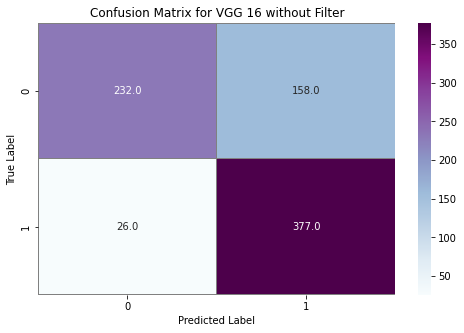

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_vgg16_WF = confusion_matrix(Y_test, binary_pred_vgg16_WF) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_vgg16_WF, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for VGG 16 without Filter")
plt.show()

#### Prediction in VGG 16 model

1/1 [==============================] - 0s 85ms/step


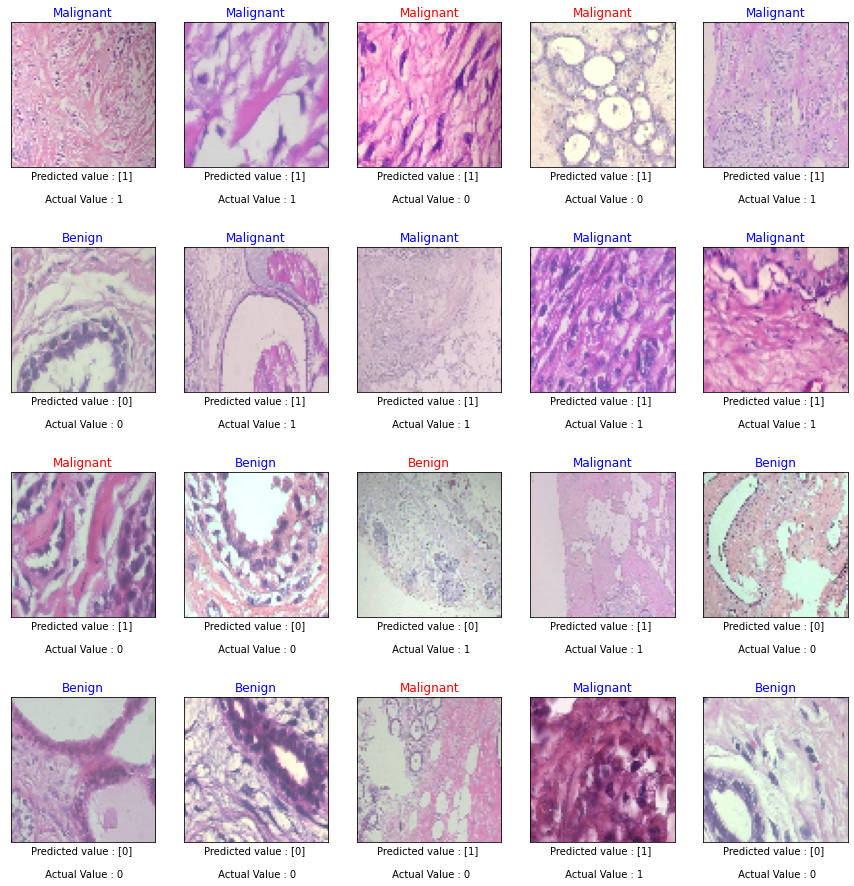

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test[i:i+1]
    pred = vgg16_model_WF.predict(input)
    binary_pred = []
    threshold = thresholds_vgg16_WF[np.argmax(precisions_vgg16_WF >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test[i].astype(np.int64)
    plt.imshow(X_test[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classification report

Text(0.5, 1.0, 'VGG 16 WITHOUT FILTER')

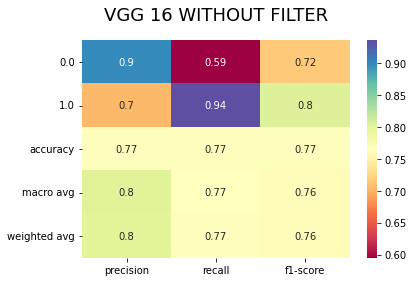

In [ ]:
clf_report_vgg16_WF = classification_report(Y_test, binary_pred_vgg16_WF,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_vgg16_WF).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("VGG 16 WITHOUT FILTER",fontsize=18,pad=20)

## VGG19 MODEL


In [ ]:
VGG19_model = VGG19(input_shape=(75,75,3), include_top=False, weights="imagenet")

80134624/80134624 [==============================] - 4s 0us/step


In [ ]:
for layer in VGG19_model.layers:
        layer.trainable = False

In [ ]:
# Flatten the output layer to 1 dimension
modelVGG19 = keras.layers.Flatten()(VGG19_model.output)

# Add a fully connected layer with 512 hidden units and ReLU activation
modelVGG19 = keras.layers.Dense(512, activation='relu')(modelVGG19)

# Add a dropout rate of 0.5
modelVGG19 = keras.layers.Dropout(0.5)(modelVGG19)

# Add a final sigmoid layer with 1 node for classification output
modelVGG19 = keras.layers.Dense(1, activation='sigmoid')(modelVGG19)

model_modelVGG19 = tf.keras.models.Model(VGG19_model.input, modelVGG19)

model_modelVGG19.compile(tf.keras.optimizers.Adam(learning_rate=0.0001), loss = 'binary_crossentropy',metrics=['accuracy'])

###Save the VGG19 Model and its Weights

In [ ]:
# model_modelVGG19.save('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/VGG19_Model')

In [ ]:
# model_modelVGG19.save_weights('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model_Weights/VGG19_Model/VGG19_Weights')

## VGG19 WITHOUT FILTER

In [ ]:
vgg19_model_WF = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/VGG19_Model')

In [ ]:
vgg19_model_WF.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
vgg19_history_WF = vgg19_model_WF.fit(X_train, Y_train, batch_size=10, epochs = 25, validation_data=(X_val, Y_val))

Epoch 1/25
397/397 [==============================] - 295s 740ms/step - loss: 0.6196 - accuracy: 0.6820 - val_loss: 0.6079 - val_accuracy: 0.6683
Epoch 2/25
397/397 [==============================] - 294s 741ms/step - loss: 0.5374 - accuracy: 0.7288 - val_loss: 0.5335 - val_accuracy: 0.7437
Epoch 3/25
397/397 [==============================] - 295s 742ms/step - loss: 0.5044 - accuracy: 0.7571 - val_loss: 0.6884 - val_accuracy: 0.6382
Epoch 4/25
397/397 [==============================] - 292s 735ms/step - loss: 0.4990 - accuracy: 0.7634 - val_loss: 0.5206 - val_accuracy: 0.7538
Epoch 5/25
397/397 [==============================] - 291s 733ms/step - loss: 0.4773 - accuracy: 0.7765 - val_loss: 0.4911 - val_accuracy: 0.7789
Epoch 6/25
397/397 [==============================] - 291s 734ms/step - loss: 0.4724 - accuracy: 0.7800 - val_loss: 0.5172 - val_accuracy: 0.7688
Epoch 7/25
397/397 [==============================] - 293s 739ms/step - loss: 0.4691 - accuracy: 0.7825 - val_loss: 0.5210 -

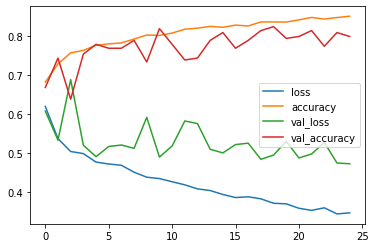

In [ ]:
history_vgg19_WF = pd.DataFrame(vgg19_history_WF.history)
history_vgg19_WF.plot()

In [ ]:
vgg19_model_WF.evaluate(X_test, Y_test)

25/25 [==============================] - 53s 2s/step - loss: 0.4611 - accuracy: 0.8184


[0.4611026644706726, 0.818411111831665]

In [ ]:
pred_vgg19_WF = vgg19_model_WF.predict(X_train)

124/124 [==============================] - 269s 2s/step


In [ ]:
precisions_vgg19_WF, recalls_vgg19_WF, thresholds_vgg19_WF = precision_recall_curve(Y_train, pred_vgg19_WF)

In [ ]:
predictions_vgg19_WF = vgg19_model_WF.predict(X_test)

25/25 [==============================] - 53s 2s/step


In [ ]:
binary_pred_vgg19_WF = []
thres_vgg19_WF = thresholds_vgg19_WF[np.argmax(precisions_vgg19_WF >= 0.80)]
for i in predictions_vgg19_WF:
    if i >= thres_vgg19_WF:
        binary_pred_vgg19_WF.append(1)
    else:
        binary_pred_vgg19_WF.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_vgg19_WF, Y_test))
print('Precision on testing set:', precision_score(binary_pred_vgg19_WF, Y_test))
print('Recall on testing set:', recall_score(binary_pred_vgg19_WF, Y_test))

Accuracy on testing set: 0.7780580075662042
Precision on testing set: 0.9032258064516129
Recall on testing set: 0.7265469061876247


#### Confusion Matrix in VGG 19 Model

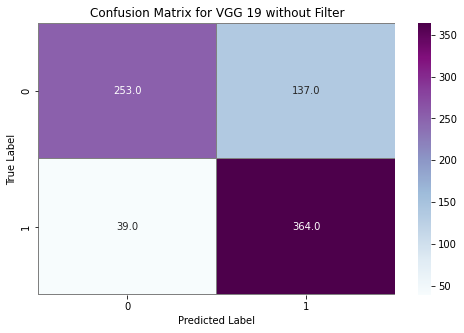

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_vgg19_WF = confusion_matrix(Y_test, binary_pred_vgg19_WF) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_vgg19_WF, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for VGG 19 without Filter")
plt.show()

#### Prediction in VGG 19 model

1/1 [==============================] - 0s 107ms/step


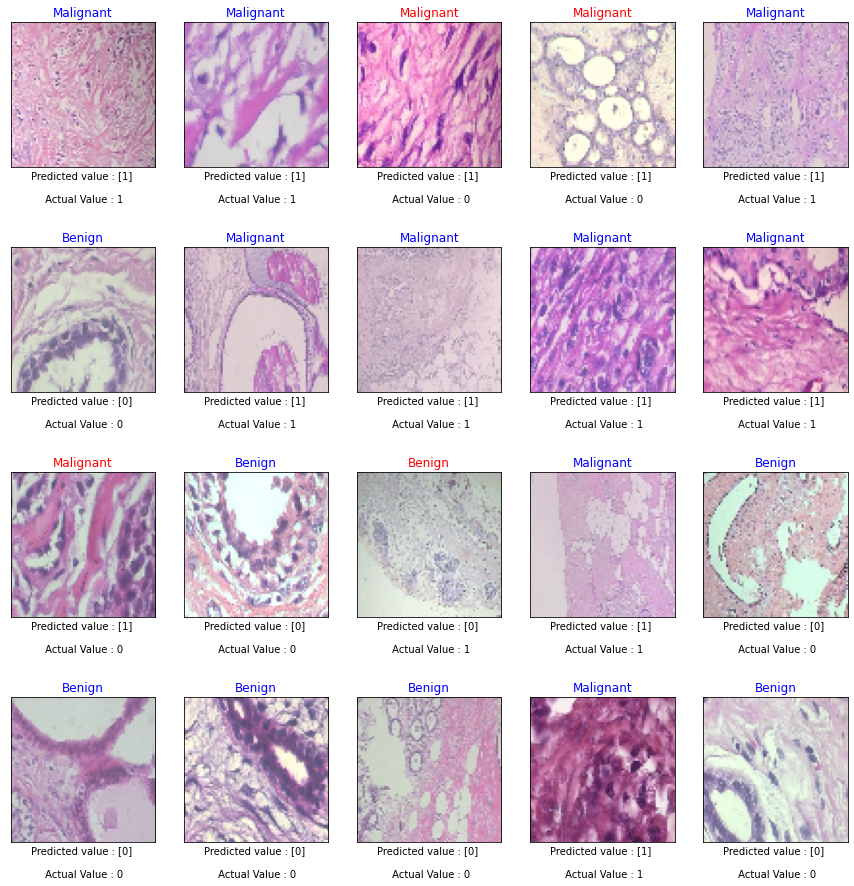

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test[i:i+1]
    pred = vgg19_model_WF.predict(input)
    binary_pred = []
    threshold = thresholds_vgg19_WF[np.argmax(precisions_vgg19_WF >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test[i].astype(np.int64)
    plt.imshow(X_test[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classifiaction report

Text(0.5, 1.0, 'VGG 19 WITHOUT FILTER')

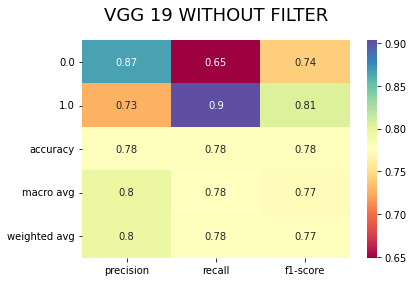

In [ ]:
clf_report_vgg19_WF =classification_report(Y_test, binary_pred_vgg19_WF,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_vgg19_WF).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("VGG 19 WITHOUT FILTER",fontsize=18,pad=20)

## InceptionV3

In [ ]:
InceptionV3_model = InceptionV3(input_shape = (75, 75, 3), include_top = False, weights = 'imagenet')

In [ ]:
for layer in InceptionV3_model.layers:
    layer.trainable = False

In [ ]:
modelInceptionV3 = keras.layers.Flatten()(InceptionV3_model.output)

modelInceptionV3 = keras.layers.Dense(1024, activation='relu')(modelInceptionV3)

modelInceptionV3 = keras.layers.Dropout(0.2)(modelInceptionV3)

modelInceptionV3 = keras.layers.Dense(1, activation='sigmoid')(modelInceptionV3)

model_InceptionV3 = tf.keras.models.Model(InceptionV3_model.input, modelInceptionV3)

model_InceptionV3.compile(optimizer = RMSprop(lr=0.0001), loss = 'binary_crossentropy', metrics = ['acc'])

####Save the InceptionV3 Model and its Weights

In [ ]:
model_InceptionV3.save('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/InceptionV3_Model')

In [ ]:
model_InceptionV3.save_weights('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model_Weights/InceptionV3_Model/InceptionV3_Weights')

## InceptionV3 WITHOUT FILTER

In [ ]:
InceptionV3_model_WF = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/InceptionV3_Model')

In [ ]:
InceptionV3_model_WF.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
InceptionV3_history_WF = InceptionV3_model_WF.fit(X_train, Y_train, batch_size=10, epochs = 25, validation_data=(X_val, Y_val))

Epoch 1/25
397/397 [==============================] - 54s 124ms/step - loss: 0.6484 - accuracy: 0.6807 - val_loss: 0.5193 - val_accuracy: 0.7638
Epoch 2/25
397/397 [==============================] - 46s 115ms/step - loss: 0.4786 - accuracy: 0.7755 - val_loss: 0.4995 - val_accuracy: 0.7688
Epoch 3/25
397/397 [==============================] - 46s 116ms/step - loss: 0.4048 - accuracy: 0.8228 - val_loss: 0.5236 - val_accuracy: 0.7638
Epoch 4/25
397/397 [==============================] - 46s 116ms/step - loss: 0.2982 - accuracy: 0.8722 - val_loss: 0.5765 - val_accuracy: 0.7236
Epoch 5/25
397/397 [==============================] - 46s 116ms/step - loss: 0.2129 - accuracy: 0.9196 - val_loss: 0.5900 - val_accuracy: 0.7839
Epoch 6/25
397/397 [==============================] - 46s 117ms/step - loss: 0.1498 - accuracy: 0.9413 - val_loss: 0.6134 - val_accuracy: 0.7839
Epoch 7/25
397/397 [==============================] - 48s 121ms/step - loss: 0.1169 - accuracy: 0.9624 - val_loss: 0.6244 - val_ac

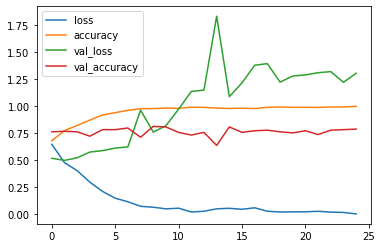

In [ ]:
history_InceptionV3_WF = pd.DataFrame(InceptionV3_history_WF.history)
history_InceptionV3_WF.plot()

In [ ]:
InceptionV3_model_WF.evaluate(X_test, Y_test)

25/25 [==============================] - 7s 273ms/step - loss: 1.4821 - accuracy: 0.7705


[1.482089638710022, 0.7704917788505554]

In [ ]:
pred_InceptionV3_WF = InceptionV3_model_WF.predict(X_train)

124/124 [==============================] - 35s 274ms/step


In [ ]:
precisions_InceptionV3_WF, recalls_InceptionV3_WF, thresholds_InceptionV3_WF = precision_recall_curve(Y_train, pred_InceptionV3_WF)

In [ ]:
predictions_InceptionV3_WF = InceptionV3_model_WF.predict(X_test)

25/25 [==============================] - 8s 273ms/step


In [ ]:
binary_pred_InceptionV3_WF = []
thres_InceptionV3_WF = thresholds_InceptionV3_WF[np.argmax(precisions_InceptionV3_WF >= 0.80)]
for i in predictions_InceptionV3_WF:
    if i >= thres_InceptionV3_WF:
        binary_pred_InceptionV3_WF.append(1)
    else:
        binary_pred_InceptionV3_WF.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_InceptionV3_WF, Y_test))
print('Precision on testing set:', precision_score(binary_pred_InceptionV3_WF, Y_test))
print('Recall on testing set:', recall_score(binary_pred_InceptionV3_WF, Y_test))

Accuracy on testing set: 0.7755359394703657
Precision on testing set: 0.7295285359801489
Recall on testing set: 0.8099173553719008


#### Confusion Matrix in Inception V3 Model

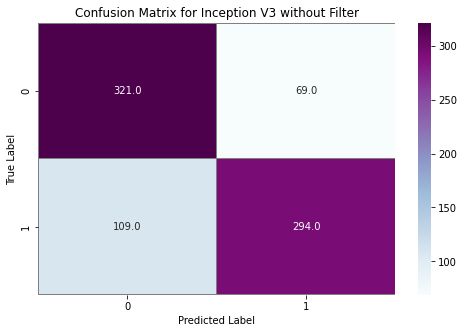

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_InceptionV3_WF = confusion_matrix(Y_test, binary_pred_InceptionV3_WF) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_InceptionV3_WF, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for Inception V3 without Filter")
plt.show()

#### Prediction in Inception V3 model

1/1 [==============================] - 0s 56ms/step


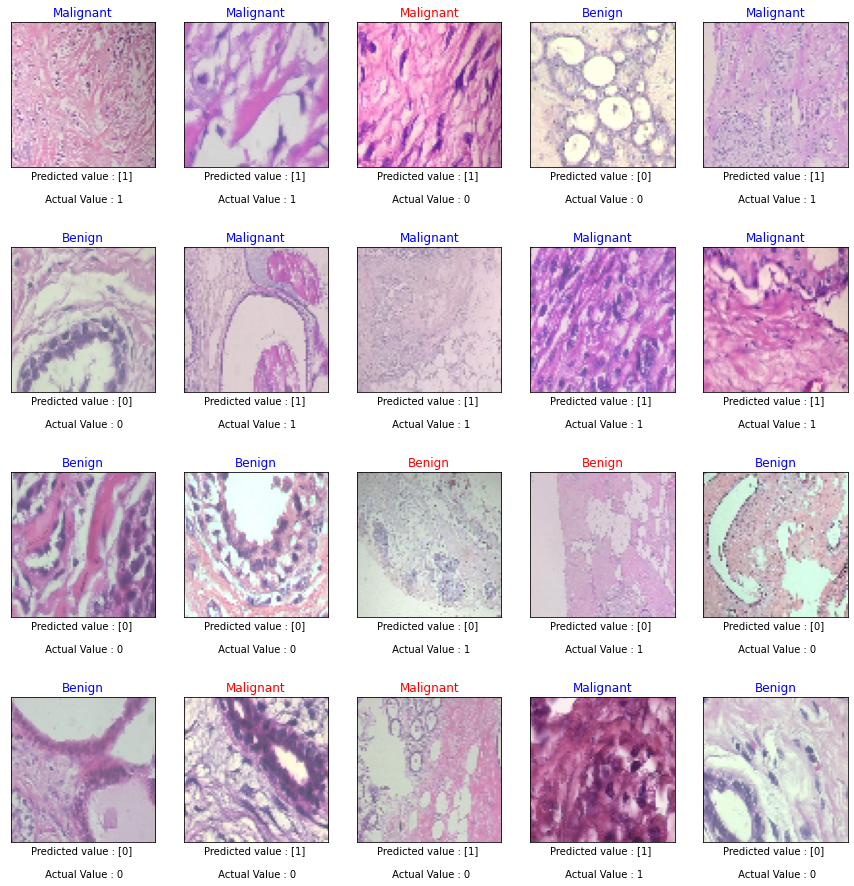

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test[i:i+1]
    pred = InceptionV3_model_WF.predict(input)
    binary_pred = []
    threshold = thresholds_InceptionV3_WF[np.argmax(precisions_InceptionV3_WF >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test[i].astype(np.int64)
    plt.imshow(X_test[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classification report

Text(0.5, 1.0, 'INCEPTION V3 WITHOUT FILTER')

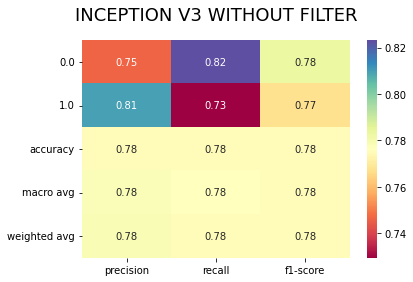

In [ ]:
clf_report_inc_WF =classification_report(Y_test, binary_pred_InceptionV3_WF,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_inc_WF).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("INCEPTION V3 WITHOUT FILTER",fontsize=18,pad=20)

# **MEDIAN FILTER**

In [ ]:
# benignImages = glob.glob('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/**/*.png', recursive=True)
# image_no = 1
# for i in benignImages:
#     with open(i,"rb") as file:
#         img = Image.open(file)
#         image_Median = img.filter(ImageFilter.MedianFilter(size = 3))
#         name = '/content/drive/MyDrive/Breast Cancer Histopathological Project/Median/Benign/BenignImage_' + str(image_no) + '.png'
#         image_Median.save(name, 'PNG')
#         image_no += 1

In [ ]:
# malignantImages = glob.glob('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/malignant/**/*.png', recursive=True)
# image_no = 1
# for i in malignantImages:
#     with open(i,"rb") as file:
#         img = Image.open(file)
#         image_Median = img.filter(ImageFilter.MedianFilter(size = 3))
#         name = '/content/drive/MyDrive/Breast Cancer Histopathological Project/Median/Malignant/MalignantImage_' + str(image_no) + '.png'
#         image_Median.save(name, 'PNG')
#         image_no += 1

In [ ]:
def getListOfFiles(dirName):
    listOfFile = os.listdir(dirName)
    allFiles = list()
    for entry in listOfFile:
        fullPath = os.path.join(dirName, entry)
        if os.path.isdir(fullPath):
            allFiles = allFiles + getListOfFiles(fullPath)
        else:
            allFiles.append(fullPath)
                
    return allFiles

In [ ]:
benign1 = getListOfFiles('/content/drive/MyDrive/Breast Cancer Histopathological Project/Median/Benign')
malignent1 = getListOfFiles('/content/drive/MyDrive/Breast Cancer Histopathological Project/Median/Malignant')

In [ ]:
Imagedata1 = pd.DataFrame(index=np.arange(0, len(benign1)+len(malignent1)), columns=["image", "target"])
k1=0
for c in [0,1]:
        if c==1:
            for m in range(len(benign1)):
                Imagedata1.iloc[k1]["image"] = benign1[m]
                Imagedata1.iloc[k1]["target"] = 0
                k1 += 1
        else:
            for m in range(len(malignent1)):
                Imagedata1.iloc[k1]["image"] = malignent1[m]
                Imagedata1.iloc[k1]["target"] = 1
                k1 += 1

In [ ]:
downsampled_data1 = resample(Imagedata1[Imagedata1['target']==1],n_samples=Imagedata1[Imagedata1['target']==0].shape[0], random_state=42)

downsampled1 = pd.concat([Imagedata1[Imagedata1['target']==0], downsampled_data1])

downsampled1['target'].value_counts()

0    2480
1    2480
Name: target, dtype: int64

In [ ]:
train_image1 = []
y1 = []

for i in tqdm(range(downsampled1.shape[0])):
    img = image.load_img(downsampled1['image'].iloc[i], target_size=(75,75,1), grayscale=False)
    img = image.img_to_array(img)
    img = img/255
    train_image1.append(img)

        
X1 = np.array(train_image1)
y1 = downsampled1.iloc[:,-1].values
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, random_state=42, test_size=0.2)
X_test1, X_val1, y_test1, y_val1 = train_test_split(X_test1, y_test1, random_state=42, test_size=0.2 , shuffle=True)

Y_train1 = np.asarray(y_train1).astype(np.float32)
Y_test1   = np.asarray(y_test1).astype(np.float32)
Y_val1   = np.asarray(y_val1).astype(np.float32)

print(X_train1.shape)
print(X_test1.shape)
print(X_val1.shape)

100%|██████████| 4960/4960 [10:44<00:00,  7.69it/s]


(3968, 75, 75, 3)
(793, 75, 75, 3)
(199, 75, 75, 3)


## CNN WITH MEDIAN FILTER

In [ ]:
cnn_model_median = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/CNN_Model')

In [ ]:
cnn_model_median.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
cnn_history_median = cnn_model_median.fit(X_train1, Y_train1, batch_size=10, epochs = 25, validation_data=(X_val1, Y_val1))

Epoch 1/25
397/397 [==============================] - 18s 12ms/step - loss: 0.6578 - accuracy: 0.5907 - val_loss: 0.9410 - val_accuracy: 0.6935
Epoch 2/25
397/397 [==============================] - 4s 10ms/step - loss: 0.5327 - accuracy: 0.7631 - val_loss: 0.4805 - val_accuracy: 0.7739
Epoch 3/25
397/397 [==============================] - 4s 10ms/step - loss: 0.5087 - accuracy: 0.7747 - val_loss: 0.6576 - val_accuracy: 0.5930
Epoch 4/25
397/397 [==============================] - 4s 10ms/step - loss: 0.4963 - accuracy: 0.7744 - val_loss: 0.5353 - val_accuracy: 0.7538
Epoch 5/25
397/397 [==============================] - 4s 10ms/step - loss: 0.5077 - accuracy: 0.7742 - val_loss: 0.5286 - val_accuracy: 0.7538
Epoch 6/25
397/397 [==============================] - 4s 10ms/step - loss: 0.5649 - accuracy: 0.7160 - val_loss: 0.5124 - val_accuracy: 0.7236
Epoch 7/25
397/397 [==============================] - 4s 9ms/step - loss: 0.5069 - accuracy: 0.7679 - val_loss: 0.4836 - val_accuracy: 0.7739

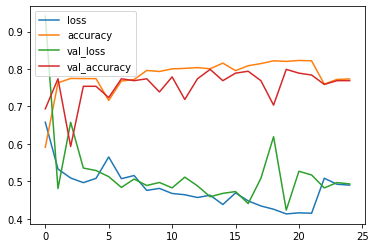

In [ ]:
history_cnn_median = pd.DataFrame(cnn_history_median.history)
history_cnn_median.plot()

In [ ]:
cnn_model_median.evaluate(X_test1, Y_test1)

25/25 [==============================] - 1s 14ms/step - loss: 0.4706 - accuracy: 0.7818


[0.47064048051834106, 0.7818410992622375]

In [ ]:
pred_cnn_median = cnn_model_median.predict(X_train1)

124/124 [==============================] - 1s 7ms/step


In [ ]:
precisions_cnn_median, recalls_cnn_median, thresholds_cnn_median = precision_recall_curve(Y_train1, pred_cnn_median)

In [ ]:
predictions_cnn_median = cnn_model_median.predict(X_test1)

25/25 [==============================] - 0s 7ms/step


In [ ]:
binary_pred_cnn_median = []
thres_cnn_median = thresholds_cnn_median[np.argmax(precisions_cnn_median >= 0.80)]
for i in predictions_cnn_median:
    if i >= thres_cnn_median:
        binary_pred_cnn_median.append(1)
    else:
        binary_pred_cnn_median.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_cnn_median, Y_test1))
print('Precision on testing set:', precision_score(binary_pred_cnn_median, Y_test1))
print('Recall on testing set:', recall_score(binary_pred_cnn_median, Y_test1))

Accuracy on testing set: 0.6986128625472888
Precision on testing set: 0.5409429280397022
Recall on testing set: 0.8014705882352942


#### Confusion Matrix in CNN Model

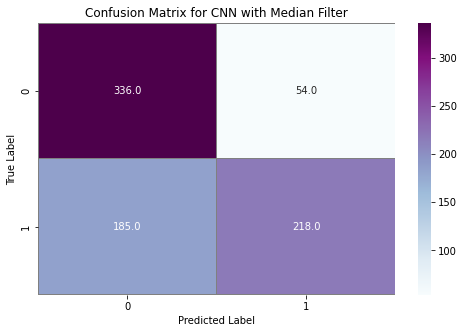

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_cnn_median = confusion_matrix(Y_test1, binary_pred_cnn_median) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_cnn_median, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for CNN with Median Filter")
plt.show()

#### Prediction in CNN model

1/1 [==============================] - 0s 18ms/step


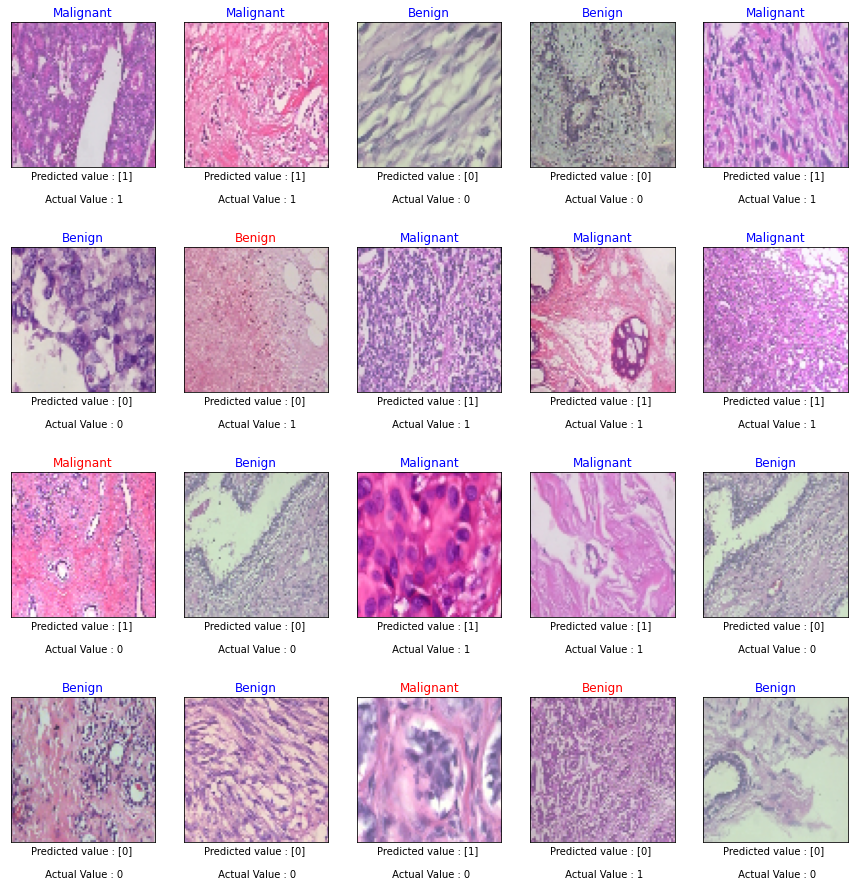

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test1[i:i+1]
    pred = cnn_model_median.predict(input)
    binary_pred = []
    threshold = thresholds_cnn_median[np.argmax(precisions_cnn_median >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test1[i].astype(np.int64)
    plt.imshow(X_test1[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classification report

Text(0.5, 1.0, 'CNN WITH MEDIAN FILTER')

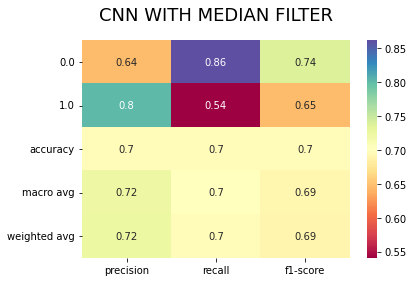

In [ ]:
clf_report_cnn_median =classification_report(Y_test1, binary_pred_cnn_median,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_cnn_median).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("CNN WITH MEDIAN FILTER",fontsize=18,pad=20)

## VGG16 WITH MEDIAN FILTER

In [ ]:
vgg16_model_median = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/VGG16_Model')

In [ ]:
vgg16_model_median.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
vgg16_history_median = vgg16_model_median.fit(X_train1, Y_train1, batch_size=10, epochs = 25, validation_data=(X_val1, Y_val1))

Epoch 1/25
397/397 [==============================] - 8s 18ms/step - loss: 0.6302 - accuracy: 0.6618 - val_loss: 0.5616 - val_accuracy: 0.7286
Epoch 2/25
397/397 [==============================] - 6s 16ms/step - loss: 0.5358 - accuracy: 0.7387 - val_loss: 0.5157 - val_accuracy: 0.7739
Epoch 3/25
397/397 [==============================] - 6s 15ms/step - loss: 0.5092 - accuracy: 0.7560 - val_loss: 0.6559 - val_accuracy: 0.6533
Epoch 4/25
397/397 [==============================] - 6s 16ms/step - loss: 0.4910 - accuracy: 0.7694 - val_loss: 0.5112 - val_accuracy: 0.7487
Epoch 5/25
397/397 [==============================] - 6s 16ms/step - loss: 0.4669 - accuracy: 0.7896 - val_loss: 0.4689 - val_accuracy: 0.7839
Epoch 6/25
397/397 [==============================] - 6s 16ms/step - loss: 0.4624 - accuracy: 0.7843 - val_loss: 0.4600 - val_accuracy: 0.7889
Epoch 7/25
397/397 [==============================] - 6s 16ms/step - loss: 0.4398 - accuracy: 0.8027 - val_loss: 0.4455 - val_accuracy: 0.8040

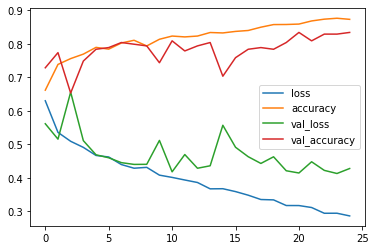

In [ ]:
history_vgg16_median = pd.DataFrame(vgg16_history_median.history)
history_vgg16_median.plot()

In [ ]:
vgg16_model_median.evaluate(X_test1, Y_test1)

25/25 [==============================] - 1s 30ms/step - loss: 0.4320 - accuracy: 0.8386


[0.4319508671760559, 0.8385876417160034]

In [ ]:
pred_vgg16_median = vgg16_model_median.predict(X_train1)

124/124 [==============================] - 3s 28ms/step


In [ ]:
precisions_vgg16_median, recalls_vgg16_median, thresholds_vgg16_median = precision_recall_curve(Y_train1, pred_vgg16_median)

In [ ]:
predictions_vgg16_median = vgg16_model_median.predict(X_test1)

25/25 [==============================] - 1s 28ms/step


In [ ]:
binary_pred_vgg16_median = []
thres_vgg16_median = thresholds_vgg16_median[np.argmax(precisions_vgg16_median >= 0.80)]
for i in predictions_vgg16_median:
    if i >= thres_vgg16_median:
        binary_pred_vgg16_median.append(1)
    else:
        binary_pred_vgg16_median.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_vgg16_median, Y_test1))
print('Precision on testing set:', precision_score(binary_pred_vgg16_median, Y_test1))
print('Recall on testing set:', recall_score(binary_pred_vgg16_median, Y_test1))

Accuracy on testing set: 0.8133669609079445
Precision on testing set: 0.9230769230769231
Recall on testing set: 0.7607361963190185


#### Confusion Matrix in VGG 16 Model

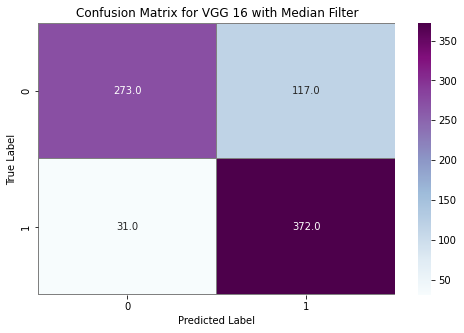

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_vgg16_median = confusion_matrix(Y_test1, binary_pred_vgg16_median) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_vgg16_median, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for VGG 16 with Median Filter")
plt.show()

#### Prediction in VGG 16 model

1/1 [==============================] - 0s 18ms/step


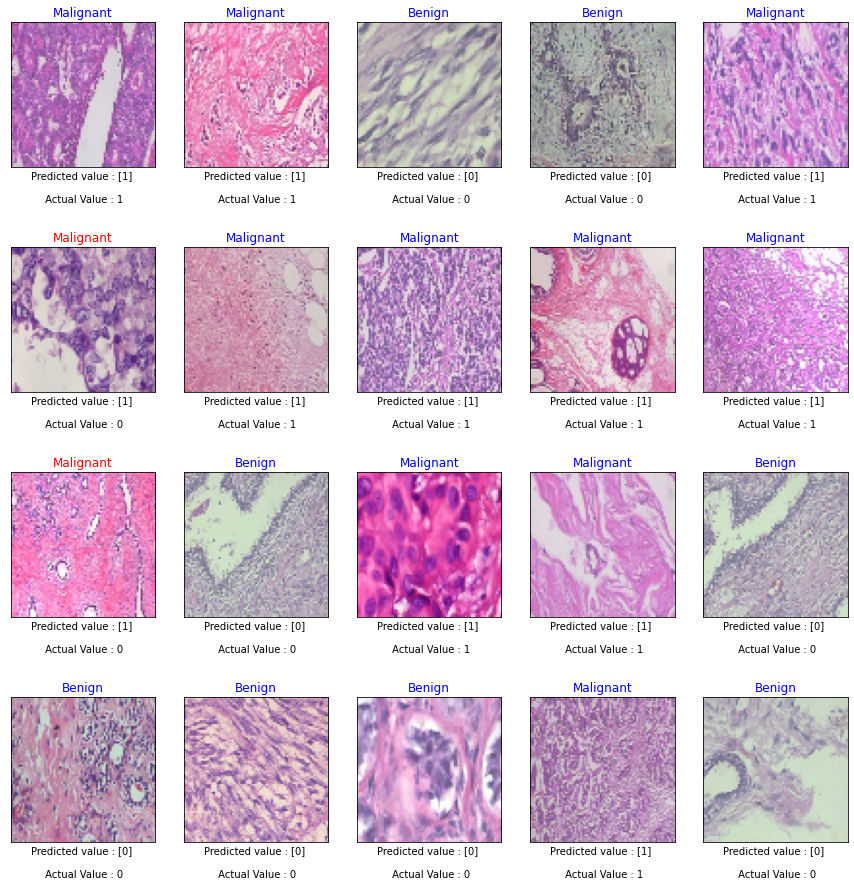

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test1[i:i+1]
    pred = vgg16_model_median.predict(input)
    binary_pred = []
    threshold = thresholds_vgg16_median[np.argmax(precisions_vgg16_median >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test1[i].astype(np.int64)
    plt.imshow(X_test1[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classification report

Text(0.5, 1.0, 'VGG 16 WITH MEDIAN FILTER')

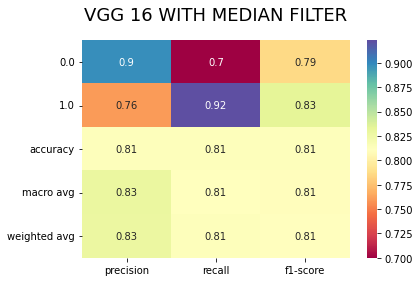

In [ ]:
clf_report_vgg16_median =classification_report(Y_test1, binary_pred_vgg16_median,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_vgg16_median).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("VGG 16 WITH MEDIAN FILTER",fontsize=18,pad=20)

## VGG19 WITH MEDIAN FILTER

In [ ]:
vgg19_model_median = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/VGG19_Model')

In [ ]:
vgg19_model_median.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
vgg19_history_median = vgg19_model_median.fit(X_train1, Y_train1, batch_size=10, epochs = 25, validation_data=(X_val1, Y_val1))

Epoch 1/25
397/397 [==============================] - 9s 20ms/step - loss: 0.6411 - accuracy: 0.6689 - val_loss: 0.5524 - val_accuracy: 0.7286
Epoch 2/25
397/397 [==============================] - 8s 19ms/step - loss: 0.5506 - accuracy: 0.7258 - val_loss: 0.5414 - val_accuracy: 0.7337
Epoch 3/25
397/397 [==============================] - 8s 19ms/step - loss: 0.5205 - accuracy: 0.7523 - val_loss: 0.5283 - val_accuracy: 0.7337
Epoch 4/25
397/397 [==============================] - 8s 19ms/step - loss: 0.5136 - accuracy: 0.7621 - val_loss: 0.5213 - val_accuracy: 0.7487
Epoch 5/25
397/397 [==============================] - 8s 20ms/step - loss: 0.4933 - accuracy: 0.7692 - val_loss: 0.5309 - val_accuracy: 0.7487
Epoch 6/25
397/397 [==============================] - 8s 19ms/step - loss: 0.4803 - accuracy: 0.7722 - val_loss: 0.5642 - val_accuracy: 0.7337
Epoch 7/25
397/397 [==============================] - 8s 20ms/step - loss: 0.4800 - accuracy: 0.7724 - val_loss: 0.5377 - val_accuracy: 0.7186

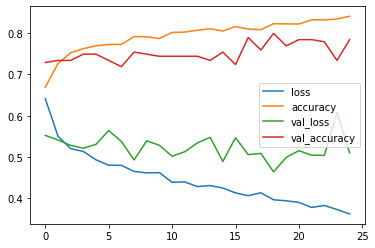

In [ ]:
history_vgg19_median = pd.DataFrame(vgg19_history_median.history)
history_vgg19_median.plot()

In [ ]:
vgg19_model_median.evaluate(X_test1, Y_test1)

25/25 [==============================] - 1s 32ms/step - loss: 0.4429 - accuracy: 0.8146


[0.4428742825984955, 0.814628005027771]

In [ ]:
pred_vgg19_median = vgg19_model_median.predict(X_train1)

124/124 [==============================] - 4s 29ms/step


In [ ]:
precisions_vgg19_median, recalls_vgg19_median, thresholds_vgg19_median = precision_recall_curve(Y_train1, pred_vgg19_median)

In [ ]:
predictions_vgg19_median = vgg19_model_median.predict(X_test1)

25/25 [==============================] - 1s 29ms/step


In [ ]:
binary_pred_vgg19_median = []
thres_vgg19_median = thresholds_vgg19_median[np.argmax(precisions_vgg19_median >= 0.80)]
for i in predictions_vgg19_median:
    if i >= thres_vgg19_median:
        binary_pred_vgg19_median.append(1)
    else:
        binary_pred_vgg19_median.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_vgg19_median, Y_test1))
print('Precision on testing set:', precision_score(binary_pred_vgg19_median, Y_test1))
print('Recall on testing set:', recall_score(binary_pred_vgg19_median, Y_test1))

Accuracy on testing set: 0.8108448928121059
Precision on testing set: 0.890818858560794
Recall on testing set: 0.7720430107526882


#### Confusion Matrix in VGG 19 Model

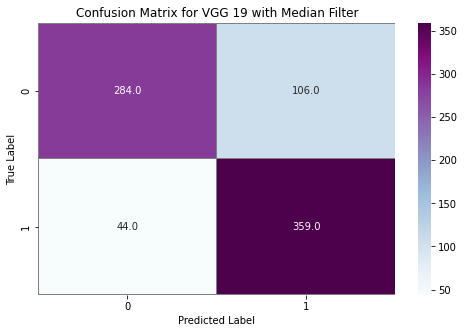

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_vgg19_median = confusion_matrix(Y_test1, binary_pred_vgg19_median) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_vgg19_median, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for VGG 19 with Median Filter")
plt.show()

#### Prediction in VGG 19 model

1/1 [==============================] - 0s 18ms/step


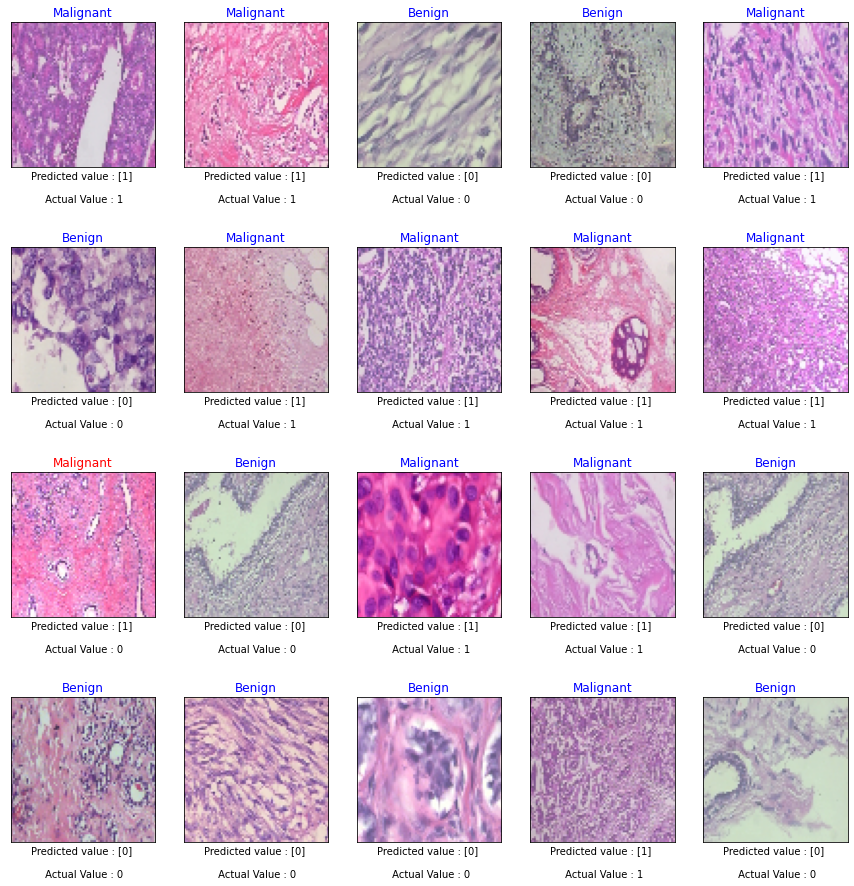

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test1[i:i+1]
    pred = vgg19_model_median.predict(input)
    binary_pred = []
    threshold = thresholds_vgg19_median[np.argmax(precisions_vgg19_median >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test1[i].astype(np.int64)
    plt.imshow(X_test1[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classification report

Text(0.5, 1.0, 'VGG 19 WITH MEDIAN FILTER')

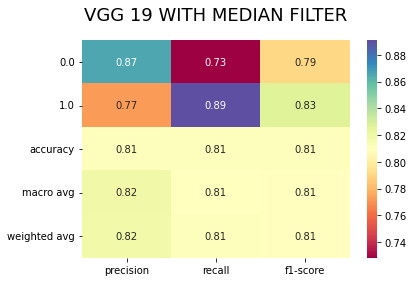

In [ ]:
clf_report_vgg19_median =classification_report(Y_test1, binary_pred_vgg19_median,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_vgg19_median).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("VGG 19 WITH MEDIAN FILTER",fontsize=18,pad=20)

## InceptionV3 WITH MEDIAN FILTER

In [ ]:
InceptionV3_model_median = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/InceptionV3_Model')

In [ ]:
InceptionV3_model_median.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
InceptionV3_history_median = InceptionV3_model_median.fit(X_train1, Y_train1, batch_size=10, epochs = 25, validation_data=(X_val1, Y_val1))

Epoch 1/25
397/397 [==============================] - 16s 27ms/step - loss: 0.6609 - accuracy: 0.6673 - val_loss: 0.5495 - val_accuracy: 0.7387
Epoch 2/25
397/397 [==============================] - 7s 18ms/step - loss: 0.4927 - accuracy: 0.7659 - val_loss: 0.5299 - val_accuracy: 0.7739
Epoch 3/25
397/397 [==============================] - 8s 21ms/step - loss: 0.4147 - accuracy: 0.8170 - val_loss: 0.5657 - val_accuracy: 0.7136
Epoch 4/25
397/397 [==============================] - 8s 20ms/step - loss: 0.3093 - accuracy: 0.8763 - val_loss: 0.6063 - val_accuracy: 0.7638
Epoch 5/25
397/397 [==============================] - 8s 21ms/step - loss: 0.2281 - accuracy: 0.9078 - val_loss: 0.8728 - val_accuracy: 0.6382
Epoch 6/25
397/397 [==============================] - 8s 21ms/step - loss: 0.1803 - accuracy: 0.9327 - val_loss: 0.6241 - val_accuracy: 0.7739
Epoch 7/25
397/397 [==============================] - 8s 20ms/step - loss: 0.1053 - accuracy: 0.9637 - val_loss: 0.6842 - val_accuracy: 0.794

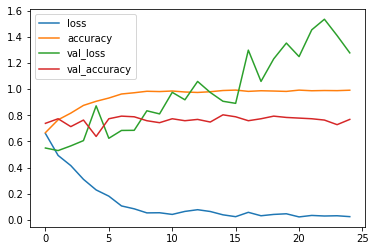

In [ ]:
history_InceptionV3_median = pd.DataFrame(InceptionV3_history_median.history)
history_InceptionV3_median.plot()

In [ ]:
InceptionV3_model_median.evaluate(X_test1, Y_test1)

25/25 [==============================] - 2s 48ms/step - loss: 1.5003 - accuracy: 0.7680


[1.5003107786178589, 0.7679697275161743]

In [ ]:
pred_InceptionV3_median = InceptionV3_model_median.predict(X_train1)

124/124 [==============================] - 4s 20ms/step


In [ ]:
precisions_InceptionV3_median, recalls_InceptionV3_median, thresholds_InceptionV3_median = precision_recall_curve(Y_train1, pred_InceptionV3_median)

In [ ]:
predictions_InceptionV3_median = InceptionV3_model_median.predict(X_test1)

25/25 [==============================] - 2s 20ms/step


In [ ]:
binary_pred_InceptionV3_median = []
thres_InceptionV3_median = thresholds_InceptionV3_median[np.argmax(precisions_InceptionV3_median >= 0.80)]
for i in predictions_InceptionV3_median:
    if i >= thres_InceptionV3_median:
        binary_pred_InceptionV3_median.append(1)
    else:
        binary_pred_InceptionV3_median.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_InceptionV3_median, Y_test1))
print('Precision on testing set:', precision_score(binary_pred_InceptionV3_median, Y_test1))
print('Recall on testing set:', recall_score(binary_pred_InceptionV3_median, Y_test1))

Accuracy on testing set: 0.7704918032786885
Precision on testing set: 0.8188585607940446
Recall on testing set: 0.7517084282460137


#### Confusion Matrix in Inception V3 Model

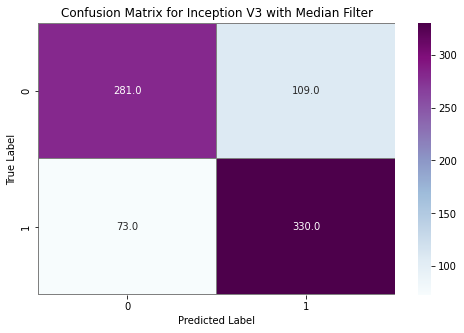

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_inceptionV3_median = confusion_matrix(Y_test1, binary_pred_InceptionV3_median) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_inceptionV3_median, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for Inception V3 with Median Filter")
plt.show()

#### Prediction in Inception V3 model

1/1 [==============================] - 0s 29ms/step


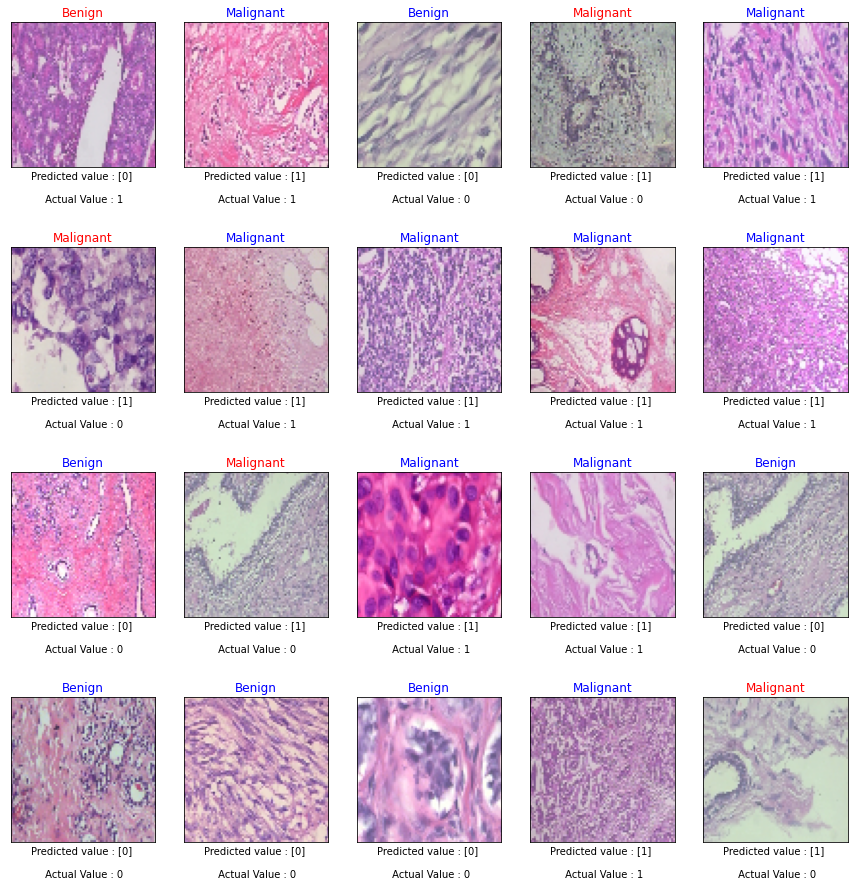

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test1[i:i+1]
    pred = InceptionV3_model_median.predict(input)
    binary_pred = []
    threshold = thresholds_InceptionV3_median[np.argmax(precisions_InceptionV3_median >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test1[i].astype(np.int64)
    plt.imshow(X_test1[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classifiaction report

Text(0.5, 1.0, 'INCEPTION V3 WITH MEDIAN FILTER')

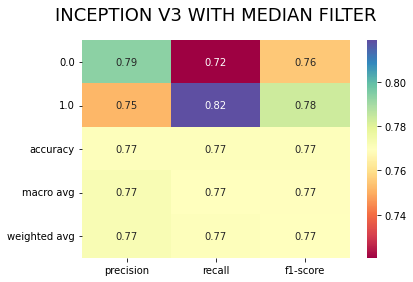

In [ ]:
clf_report_inc_median =classification_report(Y_test1, binary_pred_InceptionV3_median,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_inc_median).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("INCEPTION V3 WITH MEDIAN FILTER",fontsize=18,pad=20)

# **GAUSSIAN FILTER**

In [ ]:
# import cv2
# benignImages = glob.glob('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/benign/**/*.png', recursive=True)
# image_no1 = 1
# for i in benignImages:
#     with open(i,"rb") as file:
#         img = Image.open(file)
#         image_Gaussian = img.filter(ImageFilter.GaussianBlur)
#         name = '/content/drive/MyDrive/Breast Cancer Histopathological Project/Gaussian/Benign/GaussianImage_' + str(image_no1) + '.png'
#         image_Gaussian.save(name, 'PNG')
#         image_no1 += 1

In [ ]:
# malignantImages = glob.glob('/content/drive/MyDrive/BreaKHis_v1/histology_slides/breast/malignant/**/*.png', recursive=True)
# image_no1 = 1
# for i in malignantImages:
#     with open(i,"rb") as file:
#         img = Image.open(file)
#         image_Gaussian = img.filter(ImageFilter.GaussianBlur)
#         name = '/content/drive/MyDrive/Breast Cancer Histopathological Project/Gaussian/Malignant/MalignantImage_' + str(image_no1) + '.png'
#         image_Gaussian.save(name, 'PNG')
#         image_no1 += 1

In [ ]:
def getListOfFiles(dirName):
    listOfFile = os.listdir(dirName)
    allFiles = list()
    for entry in listOfFile:
        fullPath = os.path.join(dirName, entry)
        if os.path.isdir(fullPath):
            allFiles = allFiles + getListOfFiles(fullPath)
        else:
            allFiles.append(fullPath)
                
    return allFiles

In [ ]:
benign2=getListOfFiles('/content/drive/MyDrive/Breast Cancer Histopathological Project/Gaussian/Benign')
malignent2=getListOfFiles('/content/drive/MyDrive/Breast Cancer Histopathological Project/Gaussian/Malignant')

In [ ]:
Imagedata2 = pd.DataFrame(index=np.arange(0, len(benign2)+len(malignent2)), columns=["image", "target"])
k2=0
for c in [0,1]:
        if c==1:
            for m in range(len(benign2)):
                Imagedata2.iloc[k2]["image"] = benign2[m]
                Imagedata2.iloc[k2]["target"] = 0
                k2 += 1
        else:
            for m in range(len(malignent2)):
                Imagedata2.iloc[k2]["image"] = malignent2[m]
                Imagedata2.iloc[k2]["target"] = 1
                k2 += 1

In [ ]:
downsampled_data2 = resample(Imagedata2[Imagedata2['target']==1],n_samples=Imagedata2[Imagedata2['target']==0].shape[0], random_state=42)

downsampled2 = pd.concat([Imagedata2[Imagedata2['target']==0], downsampled_data2])

downsampled2['target'].value_counts()

0    2480
1    2480
Name: target, dtype: int64

In [ ]:
train_image2 = []
y2 = []

for i in tqdm(range(downsampled2.shape[0])):
    img = image.load_img(downsampled2['image'].iloc[i], target_size=(75,75,1), grayscale=False)
    img = image.img_to_array(img)
    img = img/255
    train_image2.append(img)

        
X2 = np.array(train_image2)
y2 = downsampled2.iloc[:,-1].values
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, random_state=42, test_size=0.2)
X_test2, X_val2, y_test2, y_val2 = train_test_split(X_test2, y_test2, random_state=42, test_size=0.2 , shuffle=True)

Y_train2 = np.asarray(y_train2).astype(np.float32)
Y_test2   = np.asarray(y_test2).astype(np.float32)
Y_val2   = np.asarray(y_val2).astype(np.float32)

print(X_train2.shape)
print(X_test2.shape)
print(X_val2.shape)

100%|██████████| 4960/4960 [10:22<00:00,  7.97it/s]


(3968, 75, 75, 3)
(793, 75, 75, 3)
(199, 75, 75, 3)


## CNN WITH GAUSSIAN FILTER

In [ ]:
cnn_model_gaussian = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/CNN_Model')

In [ ]:
cnn_model_gaussian.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
cnn_history_gaussian = cnn_model_gaussian.fit(X_train2, Y_train2, batch_size=10, epochs = 25, validation_data=(X_val2, Y_val2))

Epoch 1/25
397/397 [==============================] - 5s 10ms/step - loss: 0.5977 - accuracy: 0.6764 - val_loss: 0.5380 - val_accuracy: 0.7136
Epoch 2/25
397/397 [==============================] - 4s 10ms/step - loss: 0.5228 - accuracy: 0.7654 - val_loss: 0.5160 - val_accuracy: 0.7940
Epoch 3/25
397/397 [==============================] - 4s 11ms/step - loss: 0.5180 - accuracy: 0.7666 - val_loss: 0.4801 - val_accuracy: 0.7789
Epoch 4/25
397/397 [==============================] - 4s 10ms/step - loss: 0.5148 - accuracy: 0.7666 - val_loss: 0.6051 - val_accuracy: 0.6332
Epoch 5/25
397/397 [==============================] - 4s 10ms/step - loss: 0.5050 - accuracy: 0.7636 - val_loss: 0.6595 - val_accuracy: 0.7085
Epoch 6/25
397/397 [==============================] - 4s 10ms/step - loss: 0.5025 - accuracy: 0.7782 - val_loss: 0.4769 - val_accuracy: 0.7839
Epoch 7/25
397/397 [==============================] - 4s 10ms/step - loss: 0.4771 - accuracy: 0.7928 - val_loss: 0.4941 - val_accuracy: 0.7638

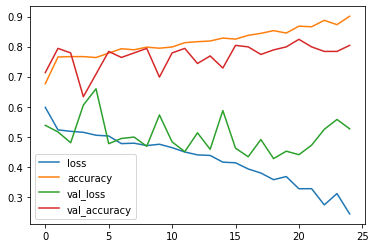

In [ ]:
history_cnn_gaussian = pd.DataFrame(cnn_history_gaussian.history)
history_cnn_gaussian.plot()

In [ ]:
cnn_model_gaussian.evaluate(X_test2, Y_test2)

25/25 [==============================] - 0s 11ms/step - loss: 0.4198 - accuracy: 0.8449


[0.41983017325401306, 0.8448927998542786]

In [ ]:
pred_cnn_gaussian = cnn_model_gaussian.predict(X_train2)

124/124 [==============================] - 1s 8ms/step


In [ ]:
precisions_cnn_gaussian, recalls_cnn_gaussian, thresholds_cnn_gaussian = precision_recall_curve(Y_train2, pred_cnn_gaussian)

In [ ]:
predictions_cnn_gaussian = cnn_model_gaussian.predict(X_test2)

25/25 [==============================] - 0s 8ms/step


In [ ]:
binary_pred_cnn_gaussian = []
thres_cnn_gaussian = thresholds_cnn_gaussian[np.argmax(precisions_cnn_gaussian >= 0.80)]
for i in predictions_cnn_gaussian:
    if i >= thres_cnn_gaussian:
        binary_pred_cnn_gaussian.append(1)
    else:
        binary_pred_cnn_gaussian.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_cnn_gaussian, Y_test2))
print('Precision on testing set:', precision_score(binary_pred_cnn_gaussian, Y_test2))
print('Recall on testing set:', recall_score(binary_pred_cnn_gaussian, Y_test2))

Accuracy on testing set: 0.7994955863808323
Precision on testing set: 0.9652605459057072
Recall on testing set: 0.7284644194756554


#### Confusion Matrix in CNN Model

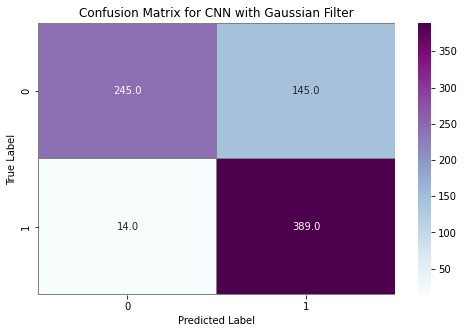

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_cnn_gaussian = confusion_matrix(Y_test2, binary_pred_cnn_gaussian) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_cnn_gaussian, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for CNN with Gaussian Filter")
plt.show()

#### Prediction in CNN model

1/1 [==============================] - 0s 17ms/step


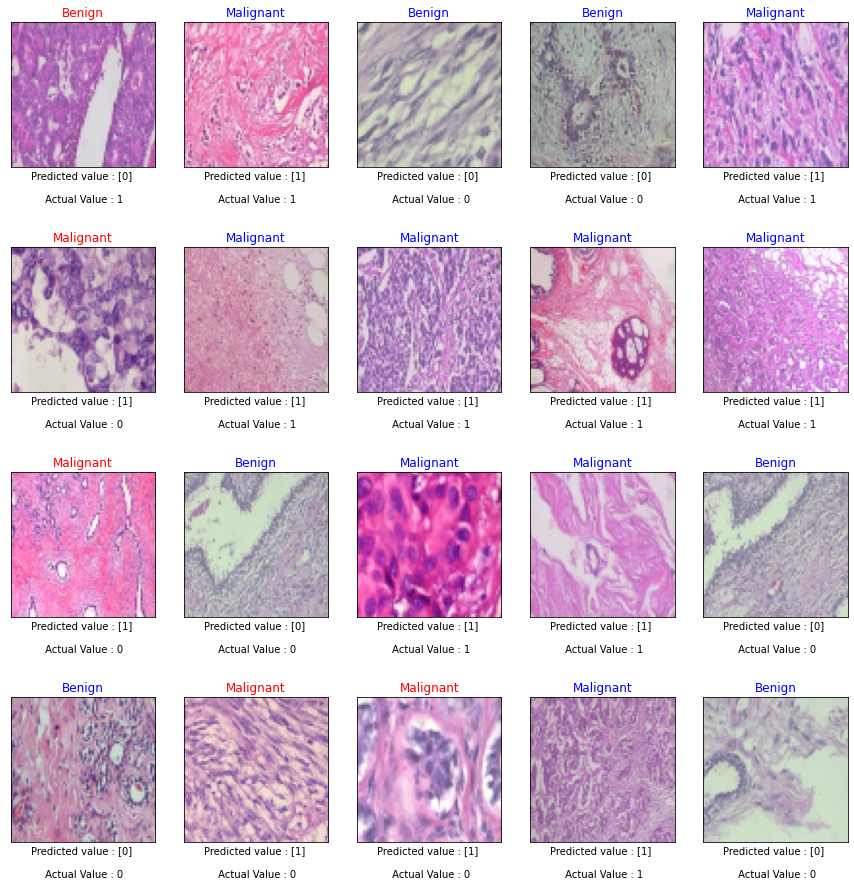

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test2[i:i+1]
    pred = cnn_model_gaussian.predict(input)
    binary_pred = []
    threshold = thresholds_cnn_gaussian[np.argmax(precisions_cnn_gaussian >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test2[i].astype(np.int64)
    plt.imshow(X_test2[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classifiaction report

Text(0.5, 1.0, 'CNN WITH GAUSSIAN FILTER')

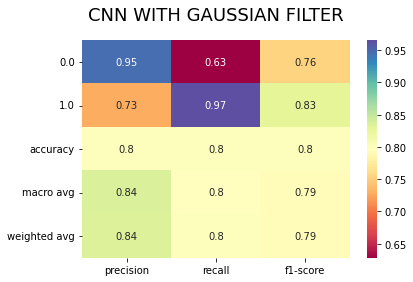

In [ ]:
clf_report_cnn_gaussian =classification_report(Y_test2, binary_pred_cnn_gaussian,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_cnn_gaussian).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("CNN WITH GAUSSIAN FILTER",fontsize=18,pad=20)

## VGG16 WITH GAUSSIAN FILTER

In [ ]:
vgg16_model_gaussian = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/VGG16_Model')

In [ ]:
vgg16_model_gaussian.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
vgg16_history_gaussian = vgg16_model_gaussian.fit(X_train2, Y_train2, batch_size=10, epochs = 25, validation_data=(X_val2, Y_val2))

Epoch 1/25
397/397 [==============================] - 15s 17ms/step - loss: 0.6243 - accuracy: 0.6673 - val_loss: 0.5357 - val_accuracy: 0.7739
Epoch 2/25
397/397 [==============================] - 6s 14ms/step - loss: 0.5276 - accuracy: 0.7364 - val_loss: 0.4879 - val_accuracy: 0.7739
Epoch 3/25
397/397 [==============================] - 6s 15ms/step - loss: 0.5015 - accuracy: 0.7566 - val_loss: 0.4906 - val_accuracy: 0.7638
Epoch 4/25
397/397 [==============================] - 6s 15ms/step - loss: 0.4786 - accuracy: 0.7752 - val_loss: 0.4768 - val_accuracy: 0.7889
Epoch 5/25
397/397 [==============================] - 6s 15ms/step - loss: 0.4695 - accuracy: 0.7760 - val_loss: 0.4598 - val_accuracy: 0.7839
Epoch 6/25
397/397 [==============================] - 6s 15ms/step - loss: 0.4456 - accuracy: 0.7959 - val_loss: 0.4722 - val_accuracy: 0.7688
Epoch 7/25
397/397 [==============================] - 6s 15ms/step - loss: 0.4350 - accuracy: 0.8072 - val_loss: 0.4725 - val_accuracy: 0.783

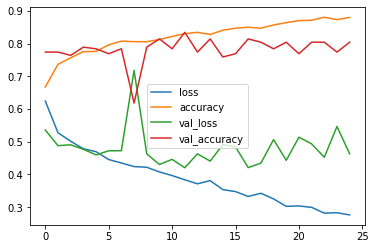

In [ ]:
history_vgg16_gaussian = pd.DataFrame(vgg16_history_gaussian.history)
history_vgg16_gaussian.plot()

In [ ]:
vgg16_model_gaussian.evaluate(X_test2, Y_test2)

25/25 [==============================] - 2s 45ms/step - loss: 0.4174 - accuracy: 0.8386


[0.4174102246761322, 0.8385876417160034]

In [ ]:
pred_vgg16_gaussian = vgg16_model_gaussian.predict(X_train2)

124/124 [==============================] - 3s 23ms/step


In [ ]:
precisions_vgg16_gaussian, recalls_vgg16_gaussian, thresholds_vgg16_gaussian = precision_recall_curve(Y_train2, pred_vgg16_gaussian)

In [ ]:
predictions_vgg16_gaussian = vgg16_model_gaussian.predict(X_test2)

25/25 [==============================] - 1s 26ms/step


In [ ]:
binary_pred_vgg16_gaussian = []
thres_vgg16_gaussian = thresholds_vgg16_gaussian[np.argmax(precisions_vgg16_gaussian >= 0.80)]
for i in predictions_vgg16_gaussian:
    if i >= thres_vgg16_gaussian:
        binary_pred_vgg16_gaussian.append(1)
    else:
        binary_pred_vgg16_gaussian.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_vgg16_gaussian, Y_test2))
print('Precision on testing set:', precision_score(binary_pred_vgg16_gaussian, Y_test2))
print('Recall on testing set:', recall_score(binary_pred_vgg16_gaussian, Y_test2))

Accuracy on testing set: 0.7881462799495587
Precision on testing set: 0.9305210918114144
Recall on testing set: 0.7281553398058253


#### Confusion Matrix in VGG 16 Model

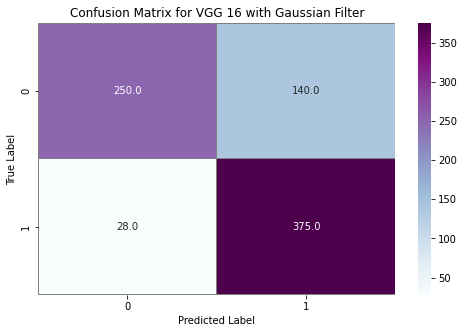

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_vgg16_gaussian = confusion_matrix(Y_test2, binary_pred_vgg16_gaussian) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_vgg16_gaussian, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for VGG 16 with Gaussian Filter")
plt.show()

#### Prediction in VGG 16 model

1/1 [==============================] - 0s 20ms/step


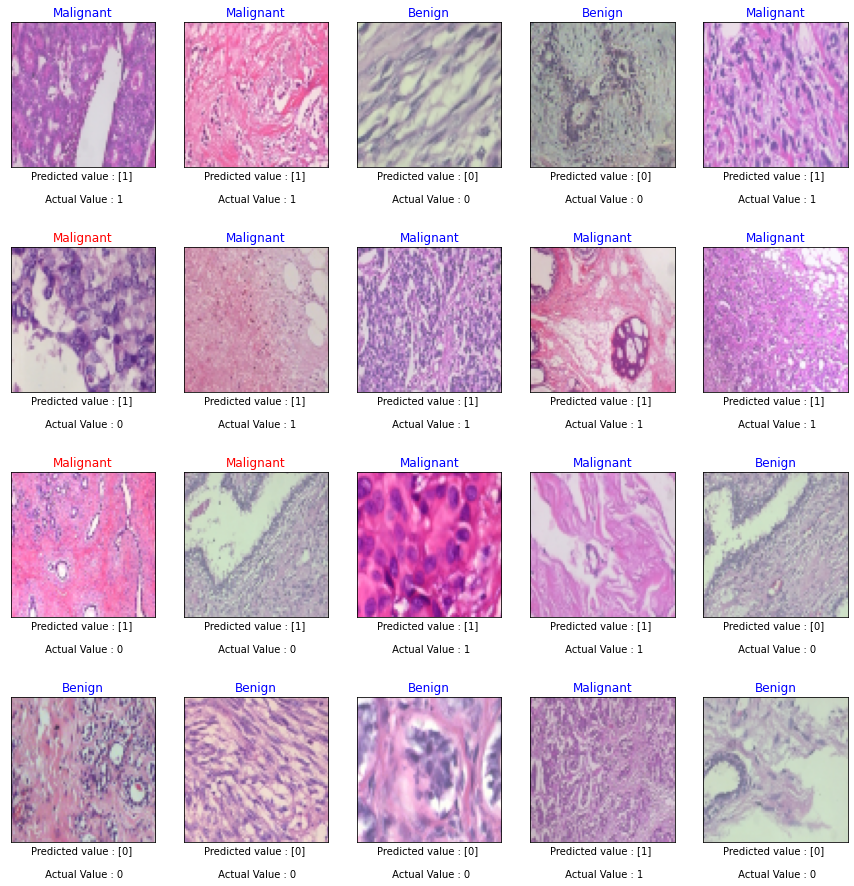

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test2[i:i+1]
    pred = vgg16_model_gaussian.predict(input)
    binary_pred = []
    threshold = thresholds_vgg16_gaussian[np.argmax(precisions_vgg16_gaussian >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test2[i].astype(np.int64)
    plt.imshow(X_test2[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classification Report

Text(0.5, 1.0, 'VGG 16 WITH GAUSSIAN FILTER')

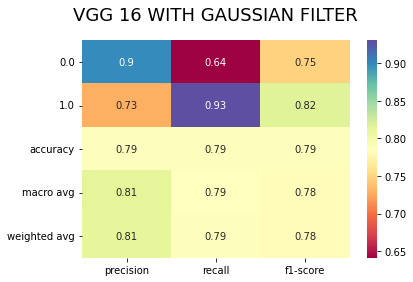

In [ ]:
clf_report_vgg16_gaussian =classification_report(Y_test2, binary_pred_vgg16_gaussian,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_vgg16_gaussian).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("VGG 16 WITH GAUSSIAN FILTER",fontsize=18,pad=20)

## VGG19 WITH GAUSSIAN FILTER

In [ ]:
vgg19_model_gaussian = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/VGG19_Model')

In [ ]:
vgg19_model_gaussian.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
vgg19_history_gaussian = vgg19_model_gaussian.fit(X_train2, Y_train2, batch_size=10, epochs = 25, validation_data=(X_val2, Y_val2))

Epoch 1/25
397/397 [==============================] - 9s 20ms/step - loss: 0.6293 - accuracy: 0.6809 - val_loss: 0.5497 - val_accuracy: 0.7437
Epoch 2/25
397/397 [==============================] - 7s 18ms/step - loss: 0.5439 - accuracy: 0.7346 - val_loss: 0.5286 - val_accuracy: 0.7236
Epoch 3/25
397/397 [==============================] - 7s 19ms/step - loss: 0.5172 - accuracy: 0.7553 - val_loss: 0.5448 - val_accuracy: 0.7588
Epoch 4/25
397/397 [==============================] - 7s 18ms/step - loss: 0.5076 - accuracy: 0.7566 - val_loss: 0.5750 - val_accuracy: 0.7437
Epoch 5/25
397/397 [==============================] - 7s 19ms/step - loss: 0.4892 - accuracy: 0.7679 - val_loss: 0.5279 - val_accuracy: 0.7487
Epoch 6/25
397/397 [==============================] - 7s 18ms/step - loss: 0.4824 - accuracy: 0.7800 - val_loss: 0.5050 - val_accuracy: 0.7437
Epoch 7/25
397/397 [==============================] - 7s 19ms/step - loss: 0.4736 - accuracy: 0.7825 - val_loss: 0.6433 - val_accuracy: 0.6834

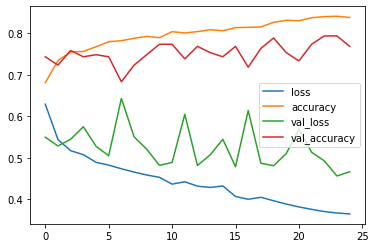

In [ ]:
history_vgg19_gaussian = pd.DataFrame(vgg19_history_gaussian.history)
history_vgg19_gaussian.plot()

In [ ]:
vgg19_model_gaussian.evaluate(X_test2, Y_test2)

25/25 [==============================] - 1s 30ms/step - loss: 0.4212 - accuracy: 0.8235


[0.4211636185646057, 0.8234552145004272]

In [ ]:
pred_vgg19_gaussian = vgg19_model_gaussian.predict(X_train2)

124/124 [==============================] - 4s 28ms/step


In [ ]:
precisions_vgg19_gaussian, recalls_vgg19_gaussian, thresholds_vgg19_gaussian = precision_recall_curve(Y_train2, pred_vgg19_gaussian)

In [ ]:
predictions_vgg19_gaussian = vgg19_model_gaussian.predict(X_test2)

25/25 [==============================] - 1s 30ms/step


In [ ]:
binary_pred_vgg19_gaussian = []
thres_vgg19_gaussian = thresholds_vgg19_gaussian[np.argmax(precisions_vgg19_gaussian >= 0.80)]
for i in predictions_vgg19_gaussian:
    if i >= thres_vgg19_gaussian:
        binary_pred_vgg19_gaussian.append(1)
    else:
        binary_pred_vgg19_gaussian.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_vgg19_gaussian, Y_test2))
print('Precision on testing set:', precision_score(binary_pred_vgg19_gaussian, Y_test2))
print('Recall on testing set:', recall_score(binary_pred_vgg19_gaussian, Y_test2))

Accuracy on testing set: 0.7944514501891551
Precision on testing set: 0.8858560794044665
Recall on testing set: 0.7531645569620253


#### Confusion Matrix in VGG 19 Model

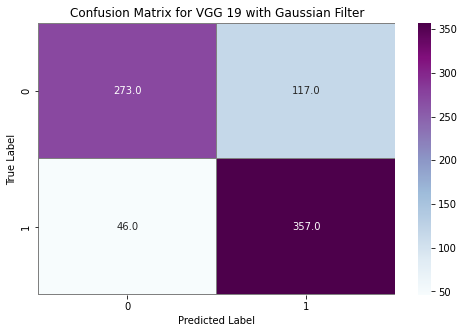

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_vgg19_gaussian = confusion_matrix(Y_test2, binary_pred_vgg19_gaussian) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_vgg19_gaussian, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for VGG 19 with Gaussian Filter")
plt.show()

#### Prediction in VGG 19 model

1/1 [==============================] - 0s 27ms/step


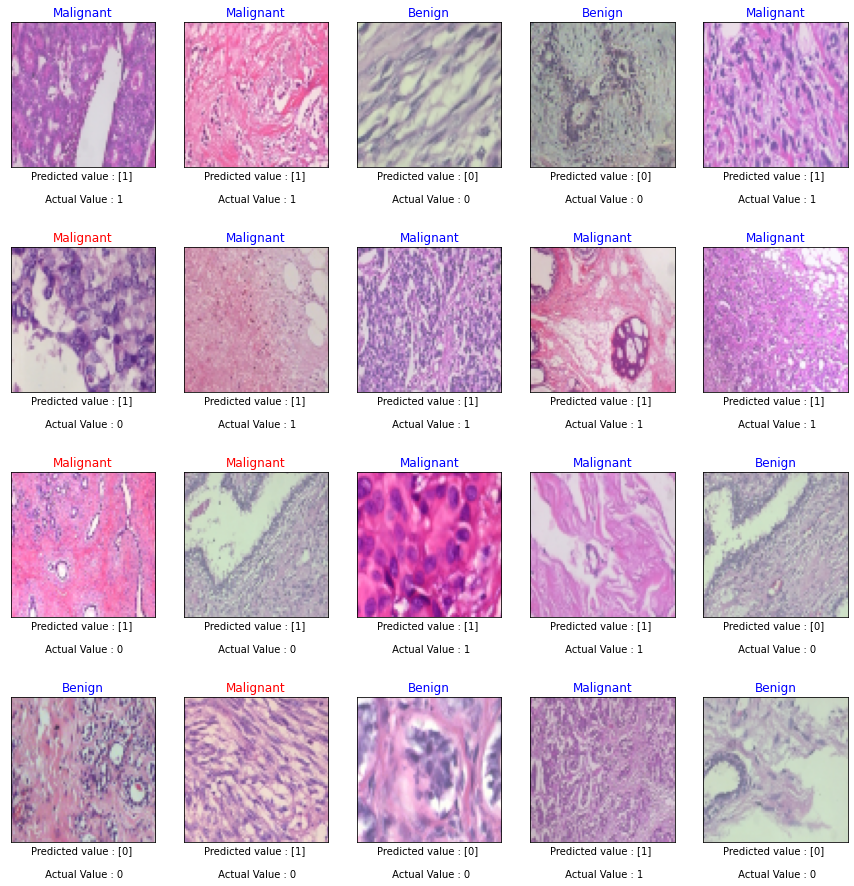

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test2[i:i+1]
    pred = vgg19_model_gaussian.predict(input)
    binary_pred = []
    threshold = thresholds_vgg19_gaussian[np.argmax(precisions_vgg19_gaussian >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test2[i].astype(np.int64)
    plt.imshow(X_test2[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classification report

Text(0.5, 1.0, 'VGG 19 WITH GAUSSIAN FILTER')

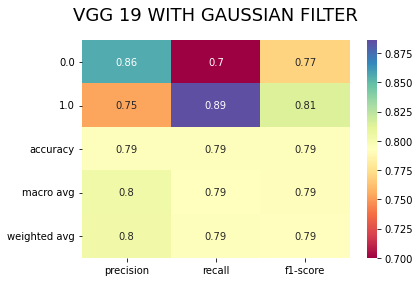

In [ ]:
clf_report_vgg19_gaussian =classification_report(Y_test2, binary_pred_vgg19_gaussian,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_vgg19_gaussian).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("VGG 19 WITH GAUSSIAN FILTER",fontsize=18,pad=20)

## InceptionV3 WITH GAUSSIAN FILTER

In [ ]:
InceptionV3_model_gaussian = tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/InceptionV3_Model')

In [ ]:
InceptionV3_model_gaussian.compile(loss='binary_crossentropy', metrics=['accuracy'], optimizer='adam')

In [ ]:
InceptionV3_history_gaussian = InceptionV3_model_gaussian.fit(X_train2, Y_train2, batch_size=10, epochs = 25, validation_data=(X_val2, Y_val2))

Epoch 1/25
397/397 [==============================] - 15s 26ms/step - loss: 0.6577 - accuracy: 0.6757 - val_loss: 0.5801 - val_accuracy: 0.7035
Epoch 2/25
397/397 [==============================] - 8s 20ms/step - loss: 0.4978 - accuracy: 0.7626 - val_loss: 0.5419 - val_accuracy: 0.7337
Epoch 3/25
397/397 [==============================] - 7s 18ms/step - loss: 0.4024 - accuracy: 0.8208 - val_loss: 0.5534 - val_accuracy: 0.7487
Epoch 4/25
397/397 [==============================] - 8s 20ms/step - loss: 0.3138 - accuracy: 0.8624 - val_loss: 0.5821 - val_accuracy: 0.7487
Epoch 5/25
397/397 [==============================] - 7s 18ms/step - loss: 0.2136 - accuracy: 0.9176 - val_loss: 0.5787 - val_accuracy: 0.7236
Epoch 6/25
397/397 [==============================] - 8s 20ms/step - loss: 0.1542 - accuracy: 0.9398 - val_loss: 0.6035 - val_accuracy: 0.7940
Epoch 7/25
397/397 [==============================] - 8s 19ms/step - loss: 0.1070 - accuracy: 0.9637 - val_loss: 0.6497 - val_accuracy: 0.763

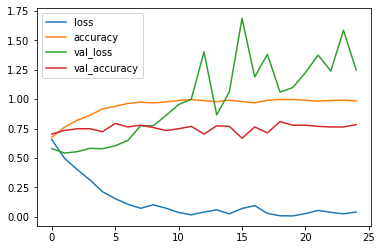

In [ ]:
history_InceptionV3_gaussian = pd.DataFrame(InceptionV3_history_gaussian.history)
history_InceptionV3_gaussian.plot()

In [ ]:
InceptionV3_model_gaussian.evaluate(X_test2, Y_test2)

25/25 [==============================] - 2s 52ms/step - loss: 1.5519 - accuracy: 0.7541


[1.5519177913665771, 0.7540983557701111]

In [ ]:
pred_InceptionV3_gaussian = InceptionV3_model_gaussian.predict(X_train2)

124/124 [==============================] - 3s 16ms/step


In [ ]:
precisions_InceptionV3_gaussian, recalls_InceptionV3_gaussian, thresholds_InceptionV3_gaussian = precision_recall_curve(Y_train2, pred_InceptionV3_gaussian)

In [ ]:
predictions_InceptionV3_gaussian = InceptionV3_model_gaussian.predict(X_test2)

25/25 [==============================] - 2s 15ms/step


In [ ]:
binary_pred_InceptionV3_gaussian = []
thres_InceptionV3_gaussian = thresholds_InceptionV3_gaussian[np.argmax(precisions_InceptionV3_gaussian >= 0.80)]
for i in predictions_InceptionV3_gaussian:
    if i >= thres_InceptionV3_gaussian:
        binary_pred_InceptionV3_gaussian.append(1)
    else:
        binary_pred_InceptionV3_gaussian.append(0)

In [ ]:
print('Accuracy on testing set:', accuracy_score(binary_pred_InceptionV3_gaussian, Y_test2))
print('Precision on testing set:', precision_score(binary_pred_InceptionV3_gaussian, Y_test2))
print('Recall on testing set:', recall_score(binary_pred_InceptionV3_gaussian, Y_test2))

Accuracy on testing set: 0.755359394703657
Precision on testing set: 0.7568238213399504
Recall on testing set: 0.7605985037406484


#### Confusion Matrix in Inception V3 Model

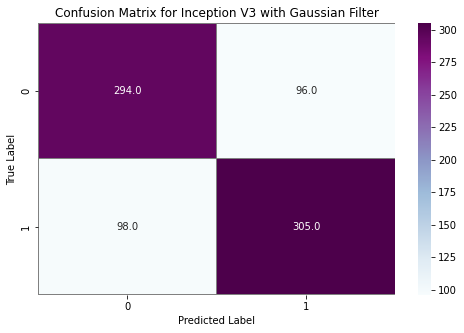

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

confusion_mtx_InceptionV3_gaussian = confusion_matrix(Y_test2, binary_pred_InceptionV3_gaussian) 
f,ax = plt.subplots(figsize=(8,5))
sns.heatmap(confusion_mtx_InceptionV3_gaussian, annot=True, linewidths=0.01,cmap="BuPu",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix for Inception V3 with Gaussian Filter")
plt.show()

#### Prediction in Inception V3 model

1/1 [==============================] - 0s 28ms/step


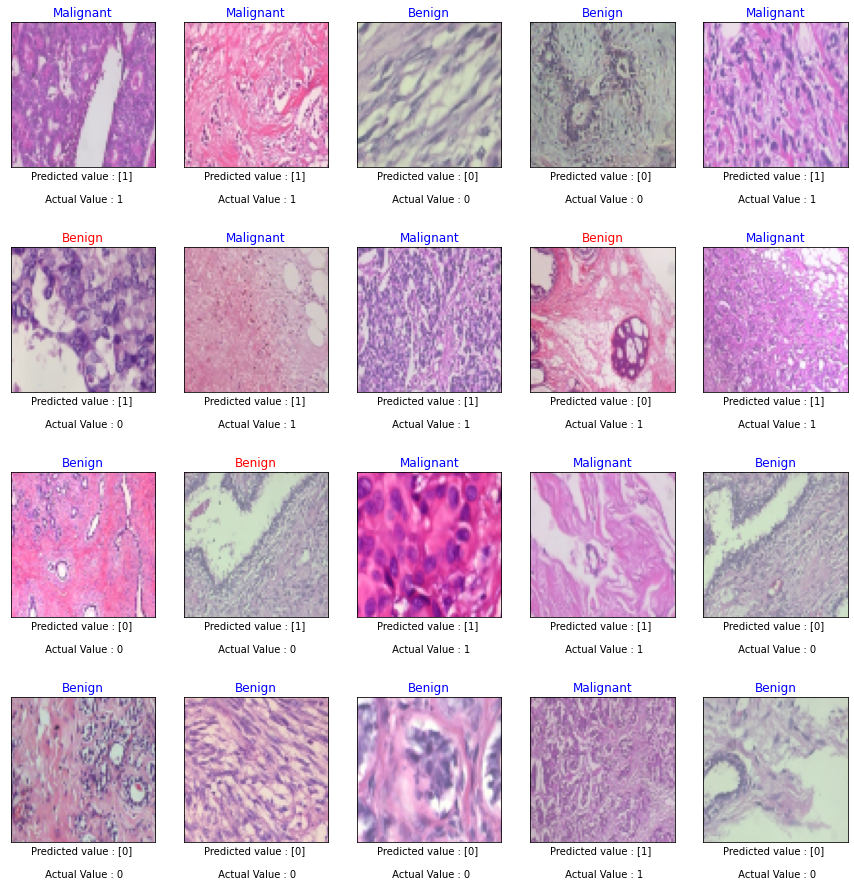

In [ ]:
plt.figure(figsize=(15,20))
for i in range(20):
    ax = plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    input = X_test2[i:i+1]
    pred = InceptionV3_model_gaussian.predict(input)
    binary_pred = []
    threshold = thresholds_InceptionV3_gaussian[np.argmax(precisions_InceptionV3_gaussian >= 0.80)]
    if pred >= threshold:
       binary_pred.append(1)
    else:
       binary_pred.append(0)
    label = Y_test2[i].astype(np.int64)
    plt.imshow(X_test2[i])
    
    if(np.array(binary_pred) == label):    
        if (np.array(binary_pred) == 1):
            ax.set_title("Malignant",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
            
        else:
            ax.set_title("Benign",color='blue')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
    else:
        if (binary_pred == 1):
            ax.set_title("Malignant",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')
        else:
            ax.set_title("Benign",color='red')
            ax.set_xlabel(f'Predicted value : {np.array(binary_pred)} \n\n Actual Value : {label}')

#### Classification report

Text(0.5, 1.0, 'INCEPTION V3 WITH GAUSSIAN FILTER')

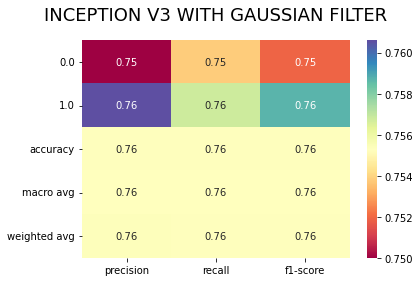

In [ ]:
clf_report_inc_gaussian =classification_report(Y_test2, binary_pred_InceptionV3_gaussian,output_dict=True)
sns.heatmap(pd.DataFrame(clf_report_inc_gaussian).iloc[:-1, :].T, annot=True,cmap="Spectral")
plt.title("INCEPTION V3 WITH GAUSSIAN FILTER",fontsize=18,pad=20)

# Deploying the deep learning model in streamlit

In [10]:
!pip install streamlit

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 102.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 239.0/239.0 KB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 111.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.8/164.8 KB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.6/80.6 KB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 21.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 KB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 60.3 MB/s eta 0:00:00
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19581 sha256=627525041533906ff7eb88d5430f6045755a72b19d

In [11]:
!pip install pyngrok

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 761.3/761.3 KB 44.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyngrok: filename=pyngrok-5.2.1-py3-none-any.whl size=19792 sha256=d3cfb8e0956f87d92bf3281cfa9ad6f5a272747a8966b5825099fded1b343cd1
  Stored in directory: /root/.cache/pip/wheels/5d/f2/70/526da675d32f17577ec47ac4c663084efe39d47c826b6c3bb1
Successfully built pyngrok


In [42]:
%%writefile app.py
import streamlit as st
import tensorflow as tf
import streamlit as st


@st.cache(allow_output_mutation=True)
def load_model():
  model=tf.keras.models.load_model('/content/drive/MyDrive/Breast Cancer Histopathological Project/Model/CNN_Model')
  return model
with st.spinner('Model is being loaded..'):
  model=load_model()

st.write("""
         # Breast Cancer Histopathology Image Classification
         """
         )

file = st.file_uploader("Please upload an brain scan file", type=["jpg", "png"])
import cv2
from PIL import Image, ImageOps
import numpy as np
st.set_option('deprecation.showfileUploaderEncoding', False)
class_names=['Benign', 'Malignant']
def import_and_predict(image_data, model):
        
    
        size = (75,75)    
        image = ImageOps.fit(image_data, size, Image.ANTIALIAS)
        image = np.asarray(image)
        img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        #img_resize = (cv2.resize(img, dsize=(75, 75),    interpolation=cv2.INTER_CUBIC))/255.
        
        img_reshape = img[np.newaxis,...]
    
        prediction = model.predict(img_reshape)
        
        return prediction
if file is None:
    st.text("Please upload an image file")
else:
    image = Image.open(file)
    st.image(image, use_column_width=True)
    predictions = import_and_predict(image, model)
    score = np.argmax(predictions)
    st.write(predictions)
    st.write(score)
    print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

Overwriting app.py


In [43]:
!streamlit run app.py &>/dev/null&

In [44]:
 !ngrok authtoken 2LGTEPDGFdQ3U5dxGVgmAKtINjS_6zdQkYxPTHSf8LoKbmTZ 

Authtoken saved to configuration file: /root/.ngrok2/ngrok.yml


In [45]:
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip

--2023-03-02 03:43:41--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 52.202.168.65, 18.205.222.128, 54.161.241.46, ...
Connecting to bin.equinox.io (bin.equinox.io)|52.202.168.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13921656 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip.1’

ngrok-stable-linux- 100%[===================>]  13.28M  4.99MB/s    in 2.7s    

2023-03-02 03:43:45 (4.99 MB/s) - ‘ngrok-stable-linux-amd64.zip.1’ saved [13921656/13921656]



In [46]:
!unzip ngrok-stable-linux-amd64.zip

Archive:  ngrok-stable-linux-amd64.zip
replace ngrok? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: ngrok                   


In [47]:
get_ipython().system_raw('./ngrok http 8501 &')

In [48]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

https://ee70-34-87-161-53.ngrok.io


In [49]:
!streamlit run /content/app.py




  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.12:8502
  External URL: http://34.87.161.53:8502

  Stopping...
  Stopping...
Error in atexit._run_exitfuncs:
Traceback (most recent call last):
  File "/usr/lib/python3.8/logging/__init__.py", line 2111, in shutdown
    def shutdown(handlerList=_handlerList):
  File "/usr/local/lib/python3.8/dist-packages/streamlit/web/bootstrap.py", line 74, in signal_handler
    server.stop()
  File "/usr/local/lib/python3.8/dist-packages/streamlit/web/server/server.py", line 351, in stop
    self._runtime.stop()
  File "/usr/local/lib/python3.8/dist-packages/streamlit/runtime/runtime.py", line 305, in stop
    async_objs.eventloop.call_soon_threadsafe(stop_on_eventloop)
  File "/usr/lib/python3.8/asyncio/base_events.py", line 764, in call_soon_threadsafe
    self._check_closed()
  File "/usr/lib/python3.8/asyncio/base_events.py", line 508, in _check_closed
    raise RuntimeError('Event loop is closed')
Runtime

In [52]:
!nohup streamlit run /content/app.py &>/dev/null&

In [51]:
from pyngrok import ngrok
url=ngrok.connect('8502')
url

<NgrokTunnel: "http://509e-34-87-161-53.ngrok.io" -> "http://localhost:8502">

In [53]:
!streamlit run /content/app.py & npx localtunnel --port 8502

[##................] \ fetchMetadata: sill resolveWithNewModule ms@2.1.2 checki


  You can now view your Streamlit app in your browser.

  Network URL: http://172.28.0.12:8503
  External URL: http://34.87.161.53:8503

npx: installed 22 in 6.229s
your url is: https://tricky-bats-pump-34-87-161-53.loca.lt
  Stopping...
^C
